# July 14, 2021 - PRS method comparison

I've run the GenoPred pipeline for 5 phenotypes: **Type II diabetes (T2D), prostate cancer, breast cancer, Body Mass Index (BMI) and Glycated hemoglobin (HbA1c).**

Phenotypes were defined as follows (for details see `extract_ukbb_phenotypes_0_0_1.ipynb`):

- **BMI**: UK Biobank datafield 21001-0.0
- **HbA1**c: UK Biobank datafield 30750-0.0
- **T2D**: Self-reported (UK Biobank datafields 20002-\*) or ICD10 diagnosed (41202-0.\*, 41204-0.\*)
- **Breast cancer**: Self-reported (UK Biobank datafields 20001-\*)
- **Prostate cancer**: Self-reported (UK biobank datafields 20001-\*)



In [1]:
library(data.table)
library(ggplot2)
library(dplyr)
library(repr)
library(stringr)


Attaching package: ‘ggplot2’


The following object is masked _by_ ‘.GlobalEnv’:

    expand_scale



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘stringr’


The following object is masked _by_ ‘.GlobalEnv’:

    str_wrap




In [2]:
# GenoPred outputs different files
# See https://github.com/opain/GenoPred/tree/master/Scripts/Model_builder
assoc_files <- list.files('results/UKBB/PRS_for_comparison/evaluation/', pattern = '.*AllMethodComp\\.assoc\\.txt', recursive = T, full.names = T)
pred_eval_files <- list.files('results/UKBB/PRS_for_comparison/evaluation/', pattern = '.*AllMethodComp\\.pred_eval\\.txt', recursive = T, full.names = T)
pred_comp_files <- list.files('results/UKBB/PRS_for_comparison/evaluation/', pattern = '.*AllMethodComp\\.pred_comp\\.txt', recursive = T, full.names = T)

In [3]:
md <- fread('config/studies_new.tsv', sep='\t')

## Input data
There are the studies selected, harmonised summary statistics were either downloaded directly from the GWAS catalog (`ftp_address`), or harmonised locally (`local_path`, see `munge_sumstats.R`).

In [4]:
md

study_id,ancestry,n_cases,n_controls,ftp_address,local_path,binary,name
<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>
GCST007954,EUR,88355,0,,resources/Base_sumstats/HbA1c_METAL_European.munged.txt.gz,no,HbA1c
GCST002783,EUR,236781,0,/pub/databases/gwas/summary_statistics/GCST002001-GCST003000/GCST002783/harmonised/25673413-GCST002783-EFO_0004340.h.tsv.gz,,no,BMI
GCST004773,EUR,26676,132532,,resources/Base_sumstats/METAANALYSIS_DIAGRAM_SE1_reformat.munged.txt.gz,yes,T2D
GCST004988,EUR,76192,63082,/pub/databases/gwas/summary_statistics/GCST004001-GCST005000/GCST004988/harmonised/29059683-GCST004988-EFO_0000305.h.tsv.gz,,yes,Breast_cancer
GCST006085,EUR,79148,61106,/pub/databases/gwas/summary_statistics/GCST006001-GCST007000/GCST006085/harmonised/29892016-GCST006085-EFO_0001663.h.tsv.gz,,yes,Prostate_cancer


In [5]:
studies <- str_extract('GCST[0-9]+', string=assoc_files)
studies

[1] "GCST002783" "GCST004773" "GCST004988" "GCST006085" "GCST007954"

In [6]:
res_assoc <- lapply(assoc_files, fread, sep=' ')

In [7]:
for ( i in seq_along(studies)){
    res_assoc[[i]]$study <- studies[i]
    res_assoc[[i]]$pheno <- md[study_id == studies[i]]$name
}

In [8]:
res_assoc <- rbindlist(res_assoc, fill = T)

## Predictors
The input to ` https://github.com/opain/GenoPred/tree/master/Scripts/Model_builder` are a list of predictors, which contain predictions for each individual for the different methods.

In [9]:
predictors <- fread('./results/UKBB/PRS_for_comparison/evaluation/GCST002783/Association_withPRS/UKBB.w_hm3.GCST002783.AllMethodComp.predictor_groups')

In [10]:
predictors

predictors,group
<chr>,<chr>
results/UKBB/PRS_for_comparison/1KG_ref/pt_clump_nonnested/GCST002783/UKBB.subset.w_hm3.GCST002783.profiles,pt_clump
results/UKBB/PRS_for_comparison/1KG_ref/lassosum/GCST002783/UKBB.subset.w_hm3.GCST002783.lassosum_profiles,lassosum
results/UKBB/PRS_for_comparison/UKBB_ref/PRScs/GCST002783/UKBB.subset.w_hm3.GCST002783.PRScs_profiles,prscs
results/UKBB/PRS_for_comparison/1KG_ref/SBLUP/GCST002783/UKBB.subset.w_hm3.GCST002783.SBLUP_profiles,sblup
results/UKBB/PRS_for_comparison/UKBB_ref/SBayesR/GCST002783/UKBB.subset.w_hm3.GCST002783.sbayesr_profiles,sbayesr
results/UKBB/PRS_for_comparison/1KG_ref/DBSLMM/GCST002783/UKBB.subset.w_hm3.GCST002783.DBSLMM_profiles,dbslmm
results/UKBB/PRS_for_comparison/1KG_ref/LDPred/GCST002783/UKBB.subset.w_hm3.GCST002783.LDPred_profiles,ldpred
results/UKBB/PRS_for_comparison/UKBB_ref/LDPred2/GCST002783/UKBB.subset.w_hm3.GCST002783.LDPred_profiles,ldpred2


In [11]:
predictors <- 'pt.clump|lassosum|prscs|sblup|sbayesr|dbslmm|ldpred2*'

In [12]:
res_assoc$method <- str_extract(res_assoc$Predictor, pattern = predictors)

In [13]:
head(res_assoc)

Predictor,BETA,SE,P,N,Obs_R2,study,pheno,Estimate,OR,LowCI,HighCI,AUC,Ncas,Ncon,Liab_R2,method
<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Group_pt.clump.PredFile1.GCST002783_1e.08,0.13324007,0.004959761,1.456400e-157,39932,0.017752917,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump
Group_pt.clump.PredFile1.GCST002783_1e.06,0.09218187,0.004983073,4.379190e-76,39932,0.008497497,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump
Group_pt.clump.PredFile1.GCST002783_1e.04,0.13034631,0.004961686,8.004584e-151,39932,0.016990160,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump
Group_pt.clump.PredFile1.GCST002783_0.01,0.18278696,0.004920070,4.919002e-297,39932,0.033411073,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump
Group_pt.clump.PredFile1.GCST002783_0.1,0.17333502,0.004928629,7.198068e-267,39932,0.030045028,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump
Group_pt.clump.PredFile1.GCST002783_0.2,0.08982957,0.004984149,2.488180e-72,39932,0.008069351,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,pt.clump


In [14]:
options(repr.plot.width=7, repr.plot.height=4, repr.plot.res=300)

In [15]:
# for SBayesR sometimes --rsq 0.95 is slightly better for binary phenotypes, --robust is better for continuous phenotypes
filter(res_assoc, method == 'sbayesr')

Predictor,BETA,SE,P,N,Obs_R2,study,pheno,Estimate,OR,LowCI,HighCI,AUC,Ncas,Ncon,Liab_R2,method
<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Group_sbayesr.PredFile5.GCST002783_SCORE_default,0.20666684,0.004896343,0.000000e+00,39932,0.0427111846,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,sbayesr
Group_sbayesr.PredFile5.GCST002783_SCORE_robust,0.25398942,0.004840272,0.000000e+00,39932,0.0645106272,GCST002783,BMI,NA,NA,NA,NA,NA,NA,NA,NA,sbayesr
Group_sbayesr.PredFile5.GCST004773_SCORE_default,NA,0.013747378,1.108953e-285,39932,0.0339173500,GCST004773,T2D,0.4965525,1.643047,1.599367,1.687920,0.6355859,7152,32780,0.05260423,sbayesr
Group_sbayesr.PredFile5.GCST004773_SCORE_robust,NA,0.013724258,1.529677e-277,39932,0.0329106163,GCST004773,T2D,0.4885497,1.629951,1.586691,1.674390,0.6336047,7152,32780,0.05101672,sbayesr
Group_sbayesr.PredFile5.GCST004988_SCORE_default,NA,0.023439448,1.597555e-129,21215,0.0286356416,GCST004988,Breast_cancer,0.5675548,1.763948,1.684745,1.846875,0.6529262,2230,18985,0.08561325,sbayesr
Group_sbayesr.PredFile5.GCST004988_SCORE_robust,NA,0.023568590,1.118003e-135,21215,0.0300805264,GCST004988,Breast_cancer,0.5842915,1.793720,1.712746,1.878522,0.6571604,2230,18985,0.08991582,sbayesr
Group_sbayesr.PredFile5.GCST006085_SCORE_default,NA,0.037050129,3.471392e-118,18717,0.0302193545,GCST006085,Prostate_cancer,0.8563189,2.354478,2.189563,2.531813,0.7266196,833,17884,0.19298114,sbayesr
Group_sbayesr.PredFile5.GCST006085_SCORE_robust,NA,0.036978237,2.432264e-116,18717,0.0297205042,GCST006085,Prostate_cancer,0.8478441,2.334608,2.171391,2.510094,0.7246587,833,17884,0.18991480,sbayesr
Group_sbayesr.PredFile5.GCST007954_SCORE_default,0.03049704,0.005002053,1.091309e-09,39932,0.0009300696,GCST007954,HbA1c,NA,NA,NA,NA,NA,NA,NA,NA,sbayesr


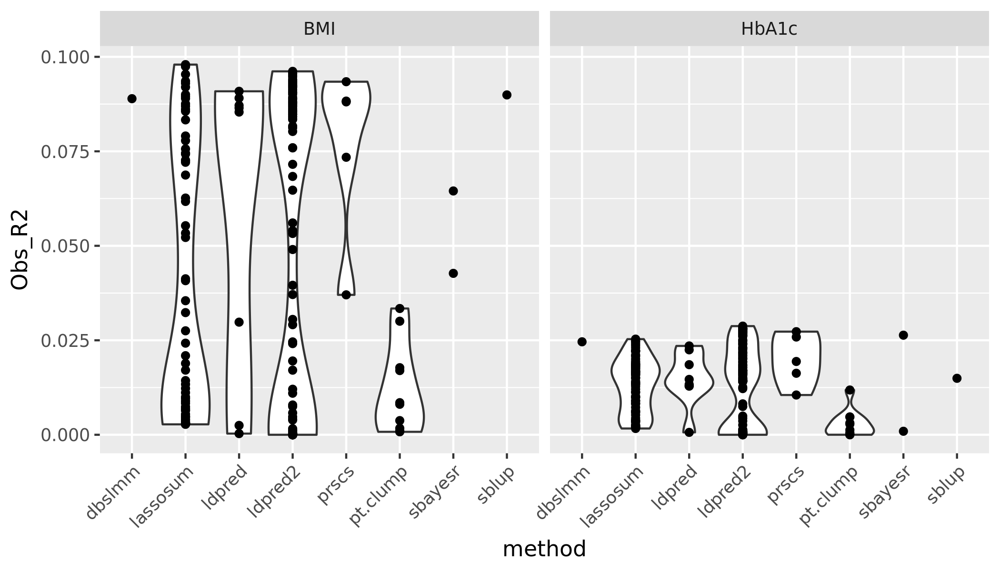

In [16]:
ggplot(filter(res_assoc, pheno %in% c('BMI','HbA1c')), aes(x=method, y=Obs_R2)) + geom_violin(scale = 'width') + geom_point() + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

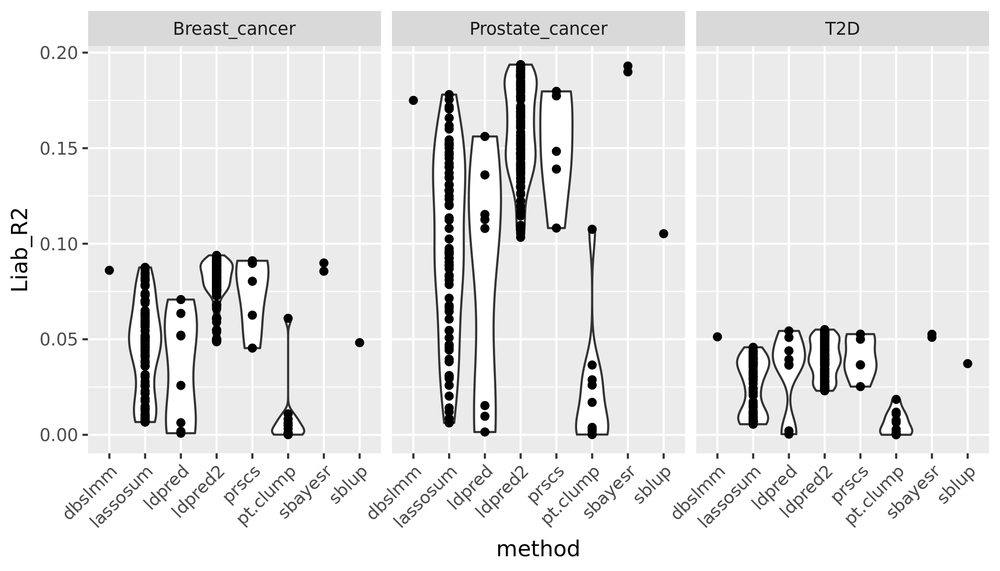

In [17]:
ggplot(filter(res_assoc, pheno %in% c('Prostate_cancer','Breast_cancer','T2D')), aes(x=method, y=Liab_R2)) + geom_violin(scale = 'width') + geom_point() + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

In [18]:
studies <- str_extract('GCST[0-9]+', string=pred_eval_files)
studies

[1] "GCST002783" "GCST004773" "GCST004988" "GCST006085" "GCST007954"

In [19]:
res_pred_eval <- lapply(pred_eval_files, fread, sep=' ')

In [20]:
for ( i in seq_along(studies)){
    res_pred_eval[[i]]$study <- studies[i]
    res_pred_eval[[i]]$pheno <- md[study_id == studies[i]]$name
}

In [21]:
res_pred_eval <- rbindlist(res_pred_eval, fill = T)

In [22]:
res_pred_eval$method <- str_extract(res_pred_eval$Model, pattern = predictors)

In [23]:
res_pred_eval[is.na(method), method:='All']

In [24]:
res_pred_eval$is_multi <- 'no'

In [25]:
res_pred_eval[!grepl('File', Model), is_multi := 'yes']

In [26]:
res_pred_eval$select <- FALSE

In [27]:
res_pred_eval[,select:=Cross_AUC==max(Cross_AUC),by=list(method, is_multi, pheno)]

In [28]:
colnames(res_pred_eval)

[1] "Model"           "CrossVal_R"      "CrossVal_R_SE"   "CrossVal_pval"  
 [5] "CrossVal_N"      "IndepVal_R"      "IndepVal_R_SE"   "IndepVal_pval"  
 [9] "IndepVal_N"      "study"           "pheno"           "CrossVal_OR"    
[13] "CrossVal_LowCI"  "CrossVal_HighCI" "Cross_LiabR2"    "Cross_AUC"      
[17] "CrossVal_Ncas"   "CrossVal_Ncon"   "IndepVal_OR"     "IndepVal_LowCI" 
[21] "IndepVal_HighCI" "Indep_LiabR2"    "Indep_AUC"       "IndepVal_Ncas"  
[25] "IndepVal_Ncon"   "method"          "is_multi"        "select"

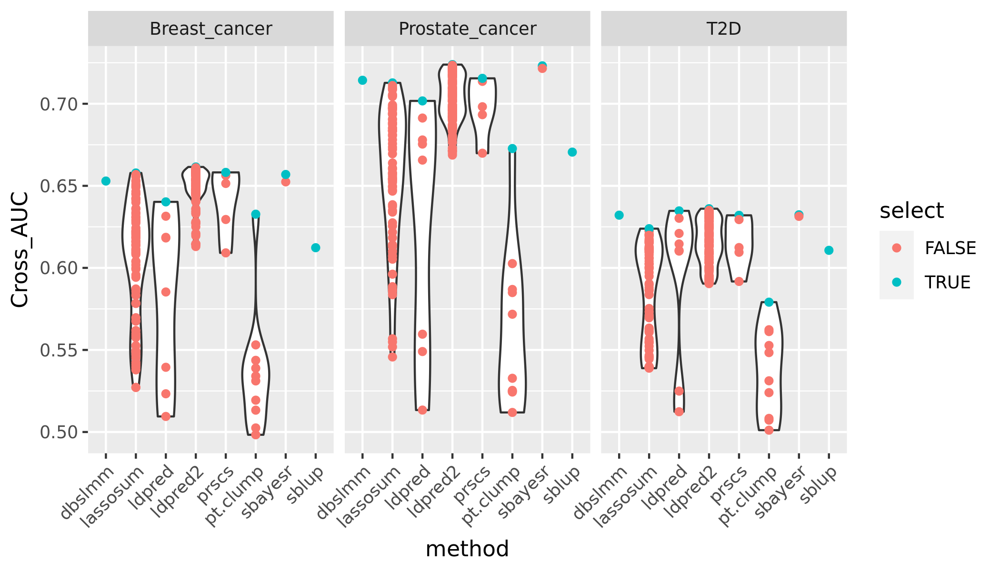

In [29]:
ggplot(filter(res_pred_eval, (pheno %in% c('Prostate_cancer','Breast_cancer','T2D')) & (is_multi == 'no') ), aes(x=method, y=Cross_AUC)) + geom_violin(scale = 'width') + geom_point(aes(col=select)) + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

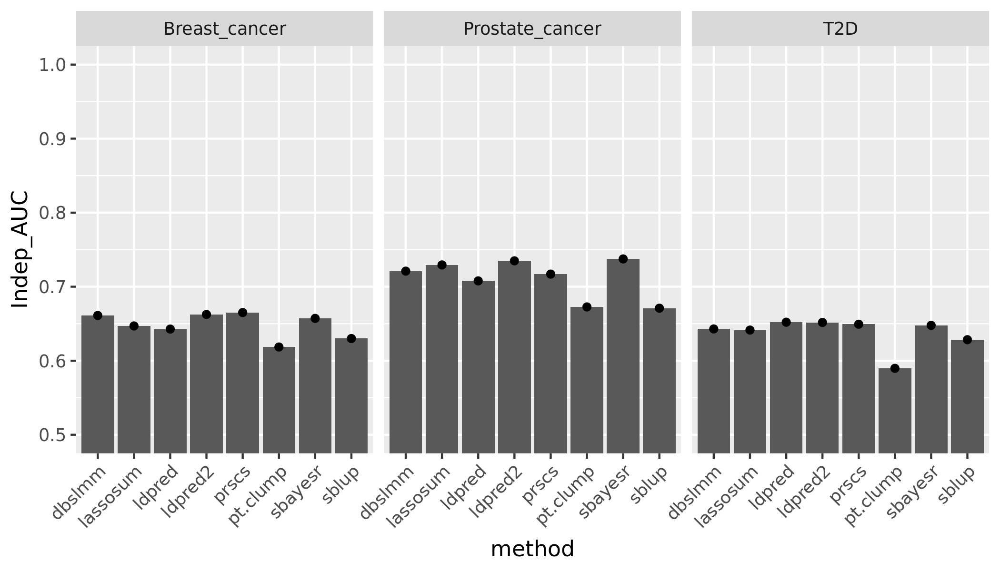

In [30]:
ggplot(filter(res_pred_eval, (pheno %in% c('Prostate_cancer','Breast_cancer','T2D')) & (is_multi == 'no') & (select == TRUE) ), aes(x=method, y=Indep_AUC)) + geom_bar(stat='identity') + geom_point() + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1)) + coord_cartesian(ylim=c(0.5,1))

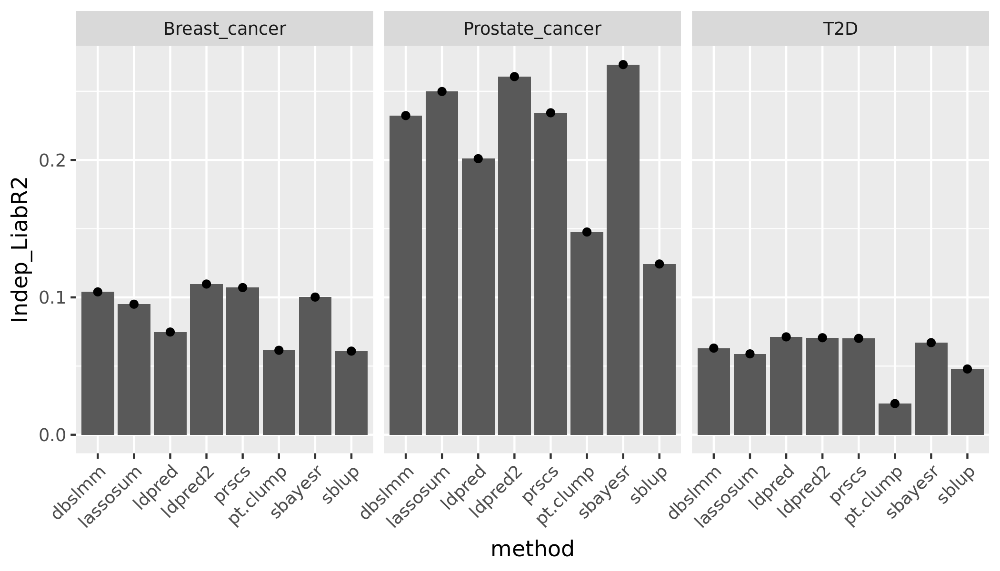

In [31]:
ggplot(filter(res_pred_eval, (pheno %in% c('Prostate_cancer','Breast_cancer','T2D')) & (is_multi == 'no') & (select == TRUE) ), aes(x=method, y=Indep_LiabR2)) + geom_bar(stat='identity') + geom_point() + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

In [32]:
res_pred_eval[,select:=CrossVal_R==max(CrossVal_R),by=list(method, is_multi, pheno)]

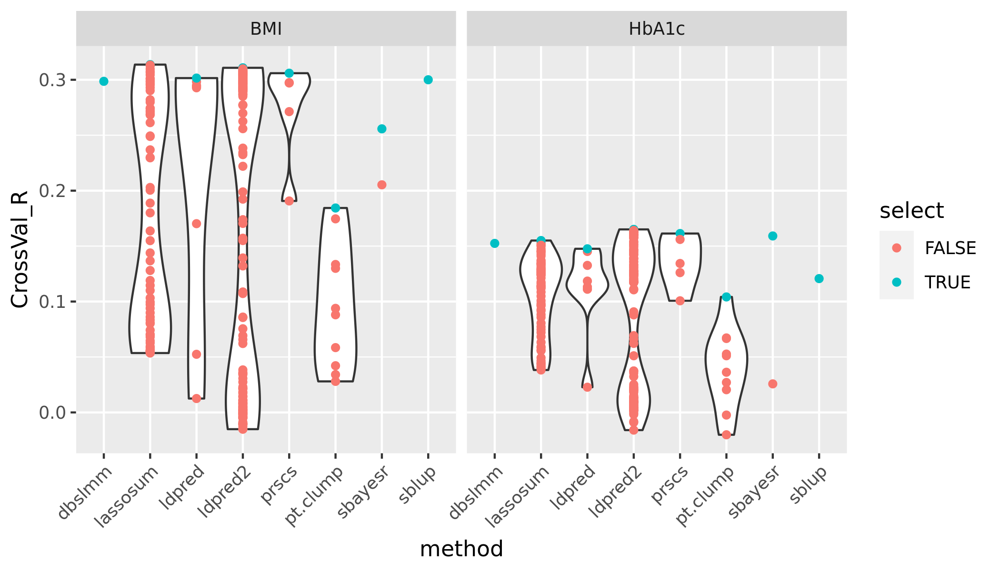

In [33]:
ggplot(filter(res_pred_eval, (pheno %in% c('BMI','HbA1c')) & (is_multi == 'no') ), aes(x=method, y=CrossVal_R)) + geom_violin(scale = 'width') + geom_point(aes(col=select)) + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

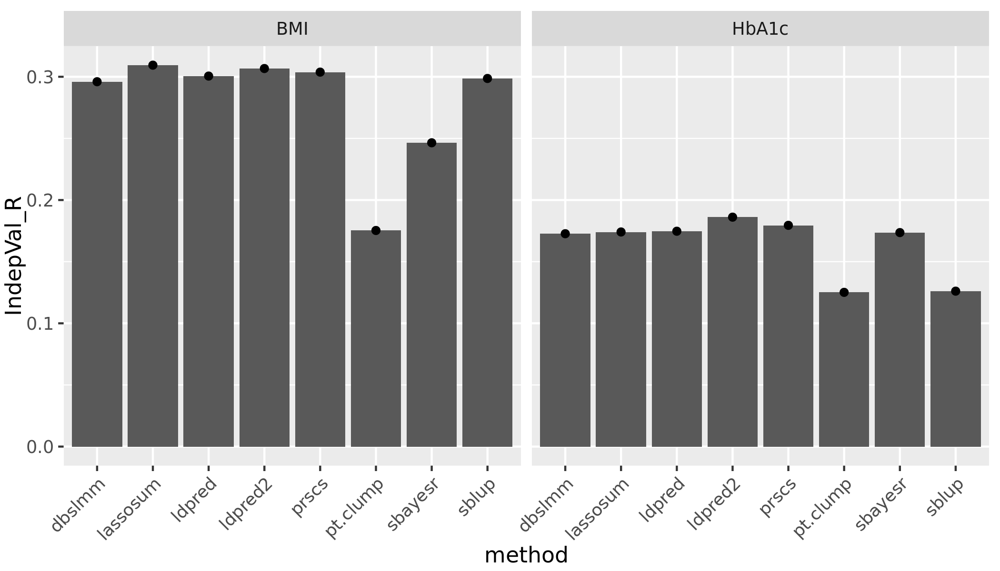

In [34]:
ggplot(filter(res_pred_eval, (pheno %in% c('BMI','HbA1c')) & (is_multi == 'no') & (select == TRUE) ), aes(x=method, y=IndepVal_R)) + geom_bar(stat='identity') + geom_point() + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

In [35]:
res_pred_eval[,select:=Cross_AUC==max(Cross_AUC),by=list(is_multi, pheno)]

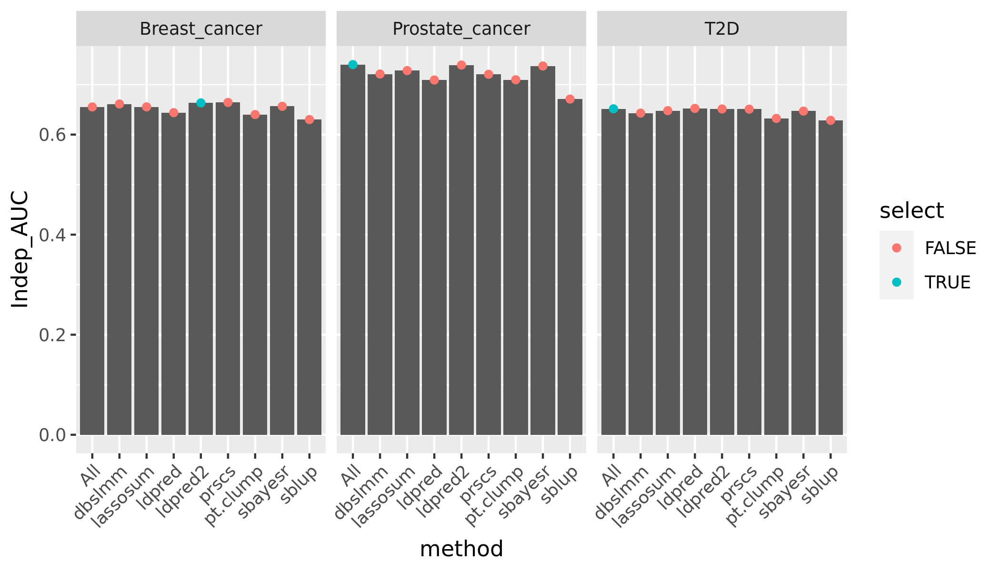

In [36]:
ggplot(filter(res_pred_eval, (pheno %in% c('Prostate_cancer','Breast_cancer','T2D')) & (is_multi == 'yes')), aes(x=method, y=Indep_AUC)) + geom_bar(stat='identity') + geom_point(aes(col=select)) + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1)) 

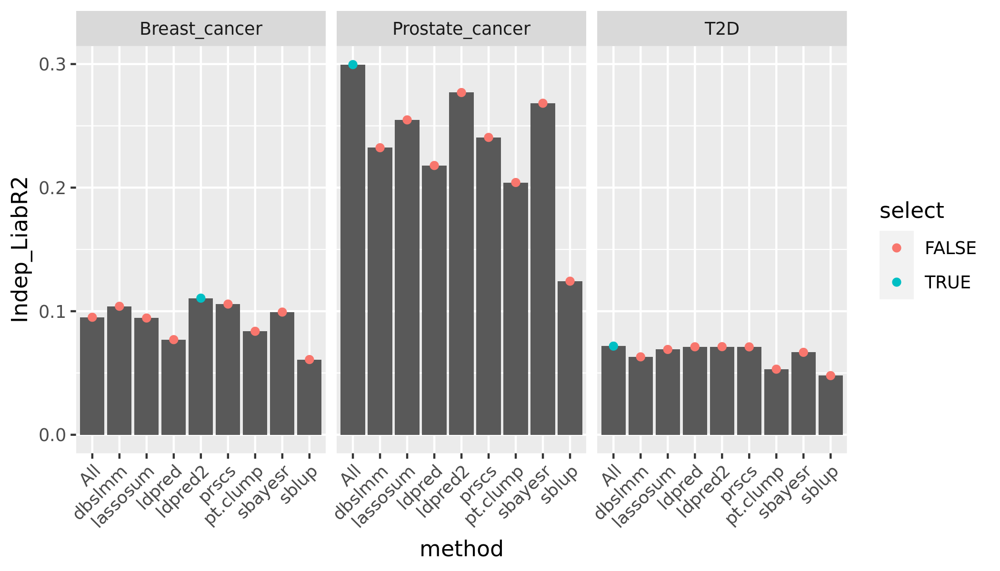

In [37]:
ggplot(filter(res_pred_eval, (pheno %in% c('Prostate_cancer','Breast_cancer','T2D')) & (is_multi == 'yes')), aes(x=method, y=Indep_LiabR2)) + geom_bar(stat='identity') + geom_point(aes(col=select)) + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1)) 

In [38]:
res_pred_eval[,select:=CrossVal_R==max(CrossVal_R),by=list(is_multi, pheno)]

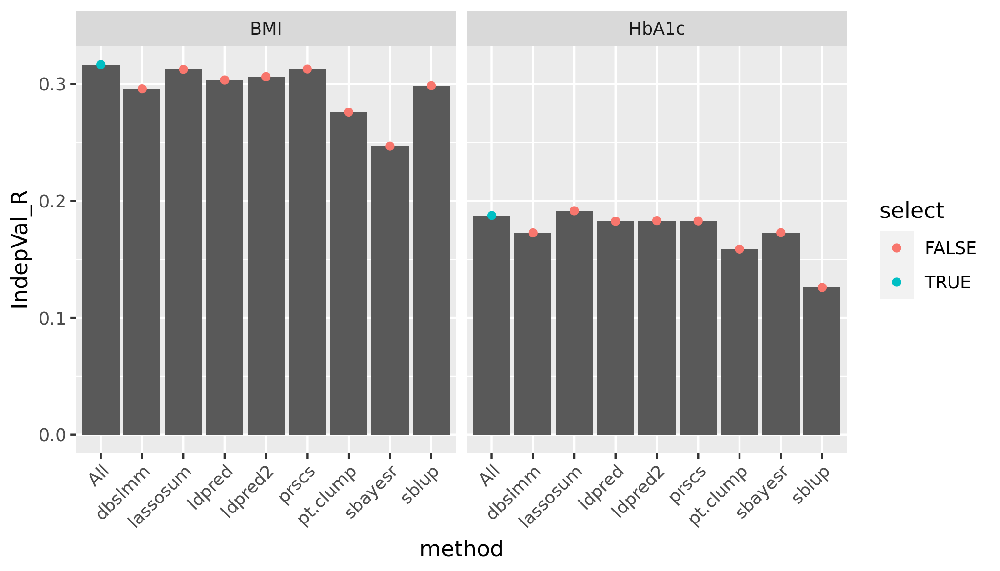

In [39]:
ggplot(filter(res_pred_eval, (pheno %in% c('BMI','HbA1c')) & (is_multi == 'yes')), aes(x=method, y=IndepVal_R)) + geom_bar(stat='identity') + geom_point(aes(col=select)) + facet_wrap(~pheno) + theme(axis.text.x = element_text(angle=45, hjust=1))

## Reproducing the GenoPred paper plots

In [40]:
# The scripts online are quite complicated, we instead do it our own way...

In [41]:
# whether to drop MultiPRS from plots where it is (almost) identical to Inf/Auto
drop = TRUE

In [42]:
source('workflow/scripts/R/source_config.R')

Loading required package: yaml



In [43]:
res_pred_eval$select<-FALSE

In [44]:
res_pred_eval$method_type <- ''

In [45]:
res_pred_eval$label <- ''

In [46]:
unique(gsub('\\.\\.','.',unique(gsub('GCST[\\.]*|PredFile','', gsub('[0-9]+|\\_group','',res_pred_eval$Model)))))

[1] "pt.clump"                 "lassosum"                
 [3] "prscs"                    "sblup"                   
 [5] "sbayesr"                  "dbslmm"                  
 [7] "ldpred"                   "pt.clump.e."             
 [9] "pt.clump."                "lassosum.SCORE.s.lambda."
[11] "prscs.phie."              "prscs.phiauto"           
[13] "sblup.SBLUP"              "sbayesr.SCORE.default"   
[15] "sbayesr.SCORE.robust"     "dbslmm.DBSLMM"           
[17] "ldpred.LDpred.p.e."       "ldpred.LDpred.inf"       
[19] "ldpred.beta.inf"          "ldpred.e..nosparse"      
[21] "ldpred.nosparse"          "ldpred.e..sparse"        
[23] "ldpred.sparse"            "All"

In [47]:
##
# pT + clump
##

res_pred_eval[grepl(pattern = 'pt.clump.PredFile', Model), c('label','method_type'):=list('pT+clump.10FCVal','CV')]

In [48]:
res_pred_eval[(method == 'pt.clump') & (is_multi == 'yes'), c('label','method_type'):=list('pT+clump.MultiPRS','MultiPRS')]

In [49]:
##
# lassosum
##

# lassosum PseudoVal
lassosum_logs <- paste0(Geno_1KG_dir, '/Score_files_for_polygenic/lassosum/',md$study_id,'/1KGPhase3.w_hm3.',md$study_id,'.log')

In [50]:
# lassosum_logs

In [51]:
lassosum_val <- sapply(lassosum_logs, read.table, sep='&', stringsAsFactors=F)

In [52]:
# lassosum_val[[1]]

In [53]:
lassosum_val_s <- sapply(lassosum_val, function(x){
    # fetch pseudoval s from log file
    as.numeric(gsub('s = ','',grep('s = ',x,value = T)))
})

In [54]:
lassosum_val_lambda <- sapply(lassosum_val, function(x){
    # fetch pseudoval lambda from log file
    as.numeric(gsub('lambda = ','',grep('lambda = ',x,value = T)))
})

In [55]:
# construct prefix from selected values
lassosum_val_param<-paste0('s',lassosum_val_s,'.lambda',lassosum_val_lambda)
lassosum_val_param<-substr(lassosum_val_param, 1, nchar(lassosum_val_param)-1) 

In [56]:
lassosum_select_pseudoval<-rbindlist(lapply(seq_along(md$study_id), function(x){
    # get the corresponding rows from the pred_eval table
    res_pred_eval[(study == md$study_id[x]) & grepl(lassosum_val_param[x], Model)]
}))

In [57]:
lassosum_select_pseudoval$method_type <- 'PseudoVal'
lassosum_select_pseudoval$label <- 'lassosum.PseudoVal'

In [58]:
res_pred_eval[grepl(pattern = 'lassosum.PredFile', Model), c('label','method_type'):=list('lassosum.10FCVal','CV')]
res_pred_eval[(method == 'lassosum') & (is_multi == 'yes'), c('label','method_type'):=list('lassosum.MultiPRS','MultiPRS')]

In [59]:
res_pred_eval <- rbind(res_pred_eval, lassosum_select_pseudoval)

In [60]:
##
# PRScs
##

res_pred_eval[grepl(pattern = 'prscs.PredFile.*phi[0-9]', Model), c('label','method_type'):=list('PRScs.10FCVal','CV')]
res_pred_eval[grepl(pattern = 'prscs.PredFile.*phiauto', Model), c('label','method_type'):=list('PRScs.PseudoVal','PseudoVal')]
res_pred_eval[(method == 'prscs') & (is_multi == 'yes'), c('label','method_type'):=list('PRScs.MultiPRS','MultiPRS')]


In [61]:
##
# SBLUP
##


In [62]:
res_pred_eval[grepl(pattern = 'sblup.PredFile.*SBLUP', Model), c('label','method_type'):=list('SBLUP.Inf','Inf')]

In [63]:
# since SBLUP only gives a single model, the "Multi-PRS" are identical to the single models
if (drop){
    res_pred_eval <-  res_pred_eval[!((method == 'sblup') & (is_multi == 'yes'))]
} else {
    res_pred_eval[(method == 'sblup') & (is_multi == 'yes'), c('label','method_type'):=list('SBLUP.MultiPRS*','MultiPRS') ] 
}

In [64]:
##
# SBayesR
##

res_pred_eval[grepl(pattern = 'sbayesr.PredFile', Model), c('label','method_type'):=list('SBayesR.PseudoVal*','PseudoVal')] # SBayesR, even though it's a "pseudovalidated" method, was run with 2 sets of parameters
res_pred_eval[(method == 'sbayesr') & (is_multi == 'yes'), c('label','method_type'):=list('SBayesR.MultiPRS*','MultiPRS')] 


In [65]:
##
# LDPred1
##

res_pred_eval[grepl(pattern = 'ldpred.PredFile.*p[0-9]', Model), c('label','method_type'):=list('LDPred.10FCVal','CV')]
res_pred_eval[grepl(pattern = 'ldpred.PredFile.*inf', Model), c('label','method_type'):=list('LDPred.Inf','Inf')]
res_pred_eval[(method == 'ldpred') & (is_multi == 'yes'), c('label','method_type'):=list('LDPred.MultiPRS','MultiPRS')]

In [66]:
##
# LDPred2
##

res_pred_eval[grepl(pattern = 'ldpred2.PredFile', Model) & !grepl(pattern = 'auto|inf', Model), c('label','method_type'):=list('LDPred2.10FCVal','CV')]
res_pred_eval[grepl(pattern = 'ldpred2.PredFile.*inf', Model), c('label','method_type'):=list('LDPred2.Inf','Inf')]
# note: these can be missing due to infinite values!
res_pred_eval[grepl(pattern = 'ldpred2.PredFile.*auto', Model), c('label','method_type'):=list('LDPred2.PseudoVal','PseudoVal')]

res_pred_eval[(method == 'ldpred2') & (is_multi == 'yes'), c('label','method_type'):=list('LDPred2.MultiPRS','MultiPRS')]

In [67]:
##
# DBSLMM
##

res_pred_eval[grepl(pattern = 'dbslmm.PredFile', Model), c('label','method_type'):=list('DBSLMM.PseudoVal','PseudoVal')]

# since DBSLMM only gives a single model, the "Multi-PRS" are identical to the single models

if (drop){
    res_pred_eval <- res_pred_eval[!((method == 'dbslmm') & (is_multi == 'yes'))]
} else {
    res_pred_eval <- res_pred_eval[(method == 'dbslmm') & (is_multi == 'yes'), c('label','method_type'):=list('DBSLMM.MultiPRS*','MultiPRS')]
}



In [68]:
res_pred_eval[method=='All' ,  c('label','method_type'):=list('All.MultiPRS','MultiPRS')]

In [69]:
if (!('CrossVal_OR' %in% names(res_pred_eval))){
    
    # only continuous phenotypes analysed...
    
    res_pred_eval$CrossVal_OR<-NA
    res_pred_eval$CrossVal_LowCI<-NA
    res_pred_eval$CrossVal_HighCI<-NA
    res_pred_eval$Cross_LiabR2<-NA
    res_pred_eval$Cross_AUC<-NA
    res_pred_eval$CrossVal_Ncas<-NA
    res_pred_eval$CrossVal_Ncon<-NA
    
    res_pred_eval$IndepVal_OR<-NA
    res_pred_eval$IndepVal_LowCI<-NA
    res_pred_eval$IndepVal_HighCI<-NA
    res_pred_eval$Indep_LiabR2<-NA
    res_pred_eval$Indep_AUC<-NA
    res_pred_eval$IndepVal_Ncas<-NA
    res_pred_eval$IndepVal_Ncon<-NA    
}

In [70]:
res_pred_eval[,select:=CrossVal_R == max(CrossVal_R),by=list(method,pheno,method_type)]

In [71]:
# sanity check
table(res_pred_eval$method, res_pred_eval$method_type, res_pred_eval$select)

, ,  = FALSE

          
            CV Inf MultiPRS PseudoVal
  All        0   0        0         0
  dbslmm     0   0        0         0
  lassosum 349   0        0         0
  ldpred    30   0        0         0
  ldpred2  625   0        0         0
  prscs     15   0        0         0
  pt.clump  45   0        0         0
  sbayesr    0   0        0         5
  sblup      0   0        0         0

, ,  = TRUE

          
            CV Inf MultiPRS PseudoVal
  All        0   0        5         0
  dbslmm     0   0        0         5
  lassosum   5   0        5         5
  ldpred     5   5        5         0
  ldpred2    5   5        5         0
  prscs      5   0        5         5
  pt.clump   5   0        5         0
  sbayesr    0   0        5         5
  sblup      0   5        0         0


In [72]:
res_eval <- res_pred_eval[(select),]

In [73]:
# res_eval now contains the selected models for all phenotypes

In [74]:
# select the corresponding models in "res_comp"

In [75]:
pred_comp_files <- pred_comp_files[ unlist(lapply(md$study_id, function(x){grep(x, pred_comp_files)})) ]

In [76]:
res_comp <- lapply(pred_comp_files, fread, sep=' ')

In [77]:
for ( i in seq_along(md$study_id)){
    # res_comp contains pairwise comparisons between models for the same phenotype
    model_select <- unique(gsub('_group','',res_eval[ study == md$study_id[i] ]$Model))
    res_comp[[i]] <- res_comp[[i]][ (Model_1 %in% model_select) & (Model_2 %in% model_select)]
    res_comp[[i]]$study <- md$study_id[i]
}

In [78]:
res_comp <- rbindlist(res_comp, fill = T)

In [79]:
res_eval$Phenotype <- factor(res_eval$pheno, levels = unique(res_eval$pheno))

In [80]:
method_mapping <- list(
    'pt.clump' = 'pT+clump',
    'lassosum' = 'lassosum',
    'All' = 'All',
    'prscs' = 'PRScs',
    'sblup' = 'SBLUP',
    'sbayesr' = 'SBayesR',
    'ldpred' = 'LDPred1',
    'ldpred2' = 'LDPred2',
    'dbslmm' = 'DBSLMM'
)

In [81]:
res_eval$Model_1 <- res_eval$Model # backup

In [82]:
head(res_eval)

Model,CrossVal_R,CrossVal_R_SE,CrossVal_pval,CrossVal_N,IndepVal_R,IndepVal_R_SE,IndepVal_pval,IndepVal_N,study,⋯,Indep_AUC,IndepVal_Ncas,IndepVal_Ncon,method,is_multi,select,method_type,label,Phenotype,Model_1
<chr>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,⋯,<dbl>,<int>,<int>,<chr>,<chr>,<lgl>,<chr>,<chr>,<fct>,<chr>
pt.clump_group,0.2854358,0.005362385,0,31945,0.2760792,0.01075590,1.101624e-139,7987,GCST002783,⋯,NA,NA,NA,pt.clump,yes,TRUE,MultiPRS,pT+clump.MultiPRS,BMI,pt.clump_group
lassosum_group,0.3190481,0.005302744,0,31945,0.3126122,0.01062996,1.390920e-180,7987,GCST002783,⋯,NA,NA,NA,lassosum,yes,TRUE,MultiPRS,lassosum.MultiPRS,BMI,lassosum_group
prscs_group,0.3158052,0.005308818,0,31945,0.3128846,0.01062896,6.537585e-181,7987,GCST002783,⋯,NA,NA,NA,prscs,yes,TRUE,MultiPRS,PRScs.MultiPRS,BMI,prscs_group
sbayesr_group,0.2556860,0.005409172,0,31945,0.2469229,0.01084431,3.009571e-111,7987,GCST002783,⋯,NA,NA,NA,sbayesr,yes,TRUE,MultiPRS,SBayesR.MultiPRS*,BMI,sbayesr_group
ldpred_group,0.3073692,0.005324296,0,31945,0.3035389,0.01066284,7.349974e-170,7987,GCST002783,⋯,NA,NA,NA,ldpred,yes,TRUE,MultiPRS,LDPred.MultiPRS,BMI,ldpred_group
ldpred2_group,0.3110425,0.005317613,0,31945,0.3062562,0.01065311,4.953178e-173,7987,GCST002783,⋯,NA,NA,NA,ldpred2,yes,TRUE,MultiPRS,LDPred2.MultiPRS,BMI,ldpred2_group


In [83]:
res_eval$Method <- sapply(res_eval$method, function(x){method_mapping[[x]]})
res_eval$Method <- factor(res_eval$Method, levels=unique(res_eval$Method))

In [84]:
res_eval$Model<-factor(res_eval$method_type, level=c('MultiPRS','CV','PseudoVal','Inf'))

In [85]:
table(res_eval$Model)


 MultiPRS        CV PseudoVal       Inf 
       35        25        20        15 

In [86]:
res_eval$Test <- res_eval$label

In [87]:
###
# Create plot showing performance of each method
###

In [88]:
library(cowplot)

Warning message:
“Removed 17 rows containing missing values (geom_bar).”
Warning message:
“Removed 17 rows containing missing values (geom_bar).”


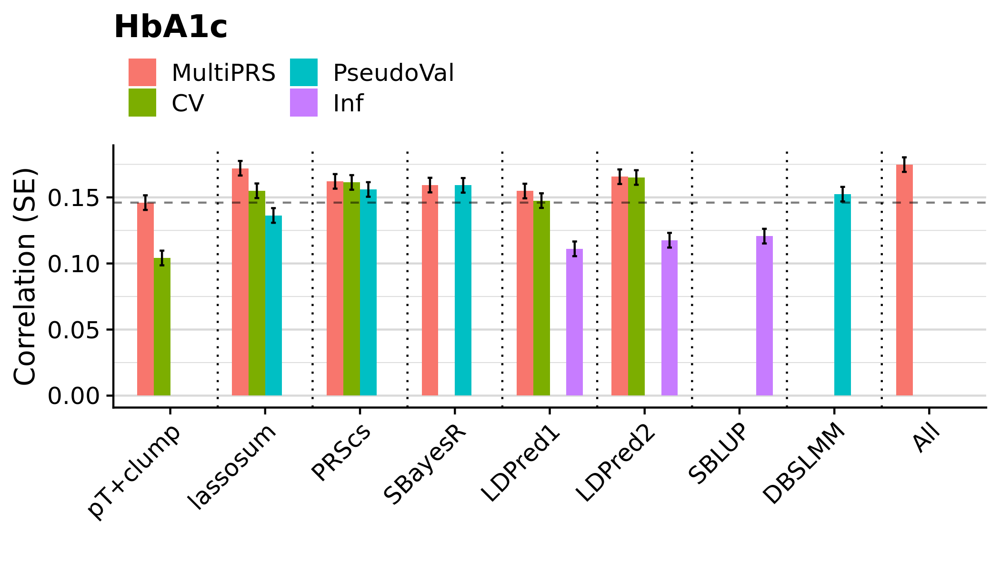

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


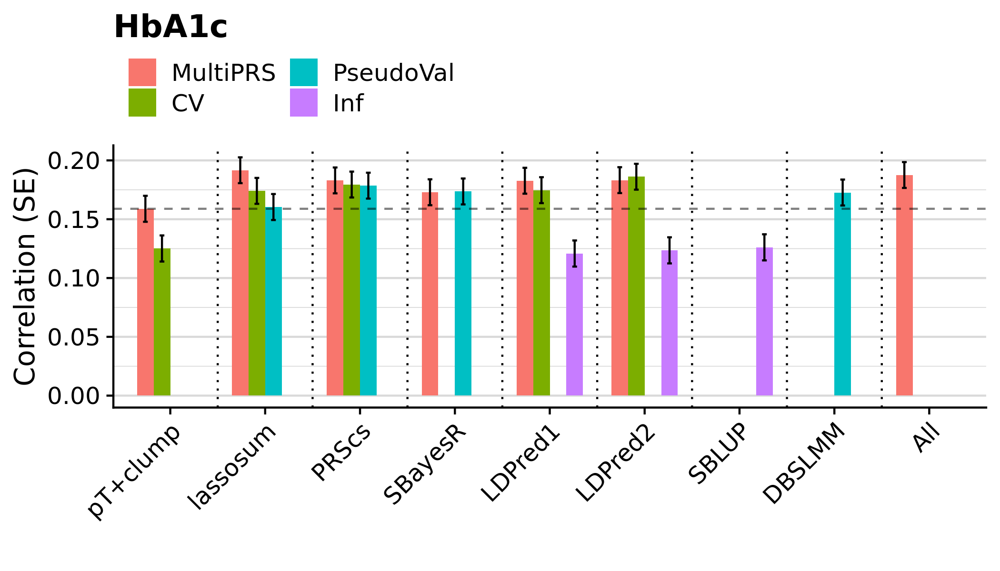

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


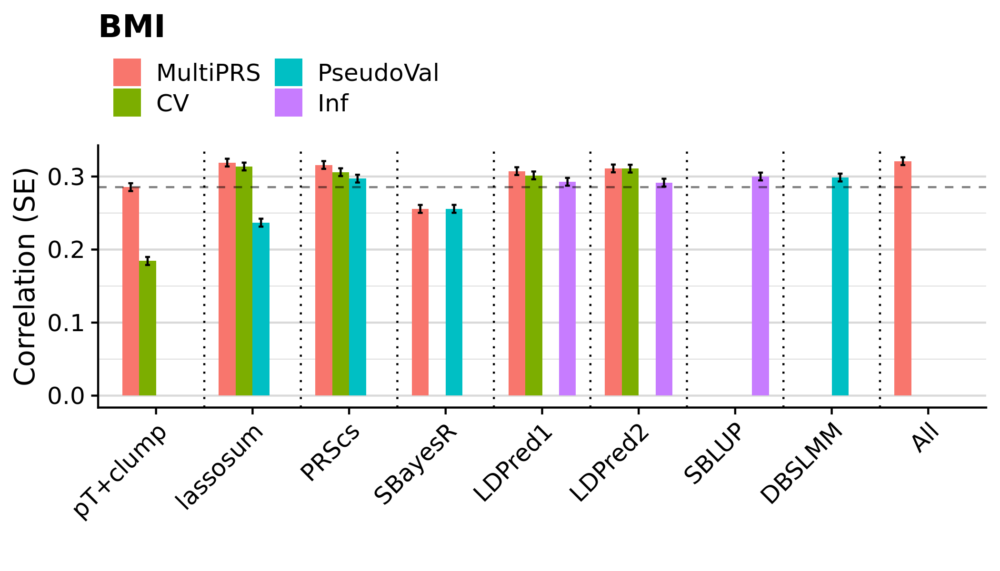

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


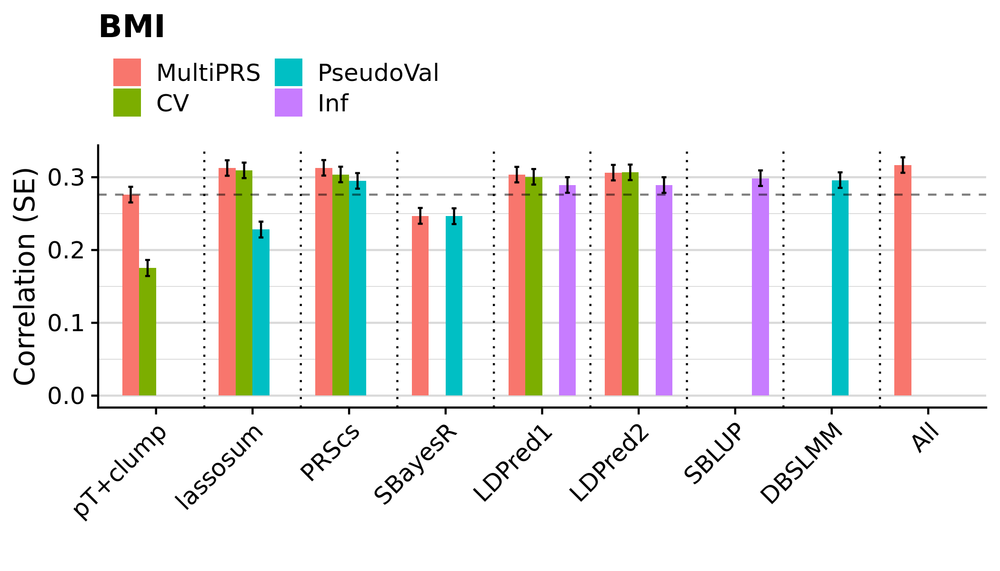

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


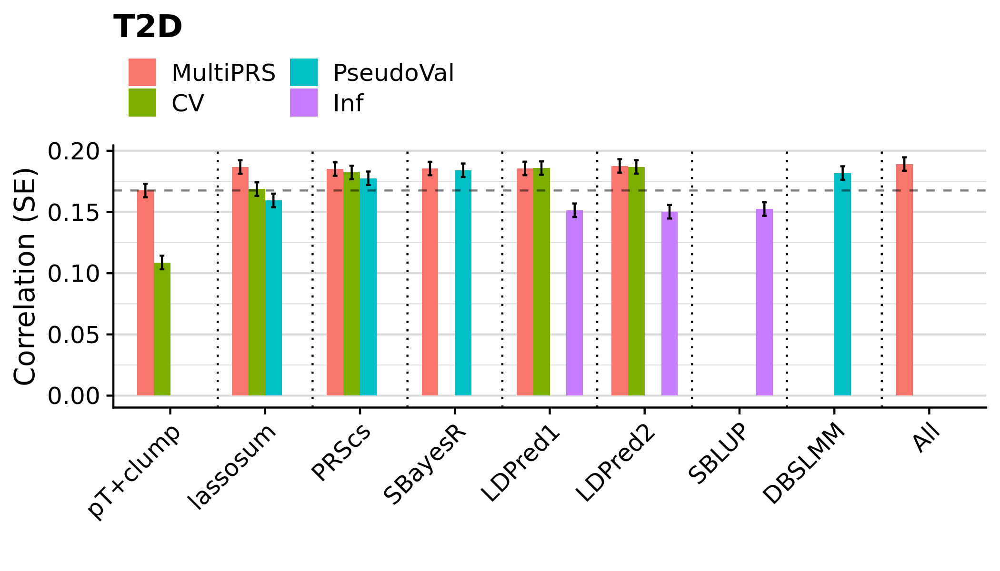

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


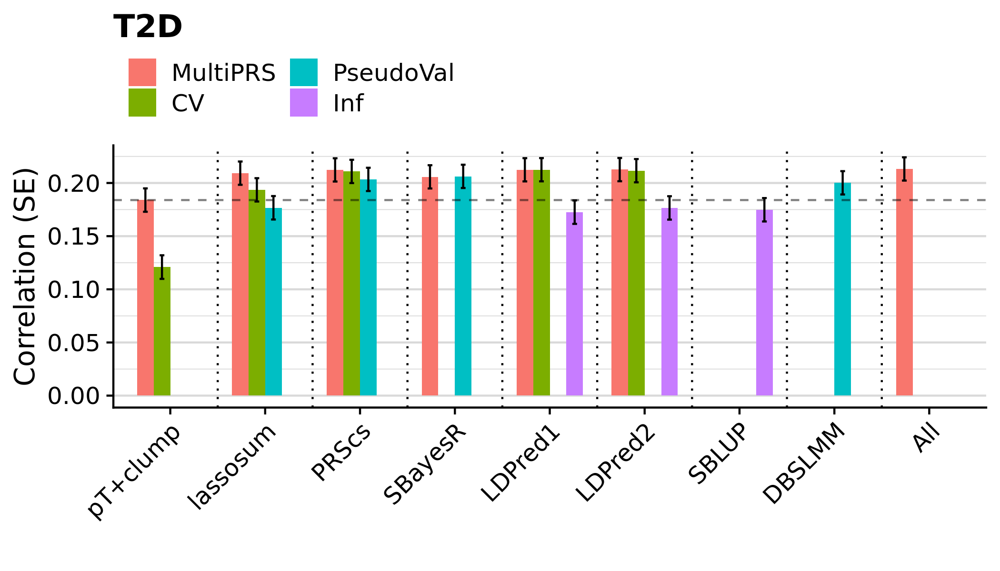

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


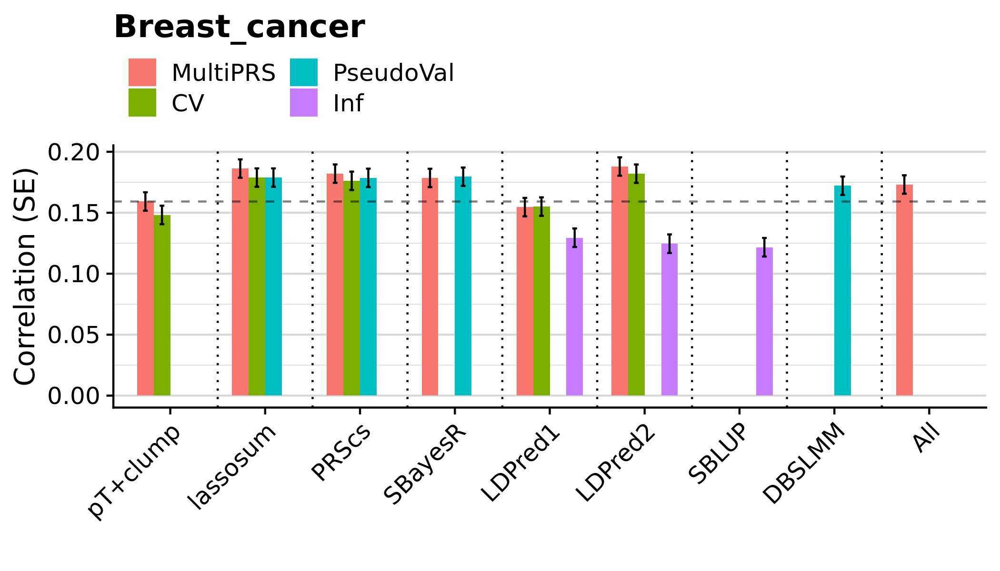

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


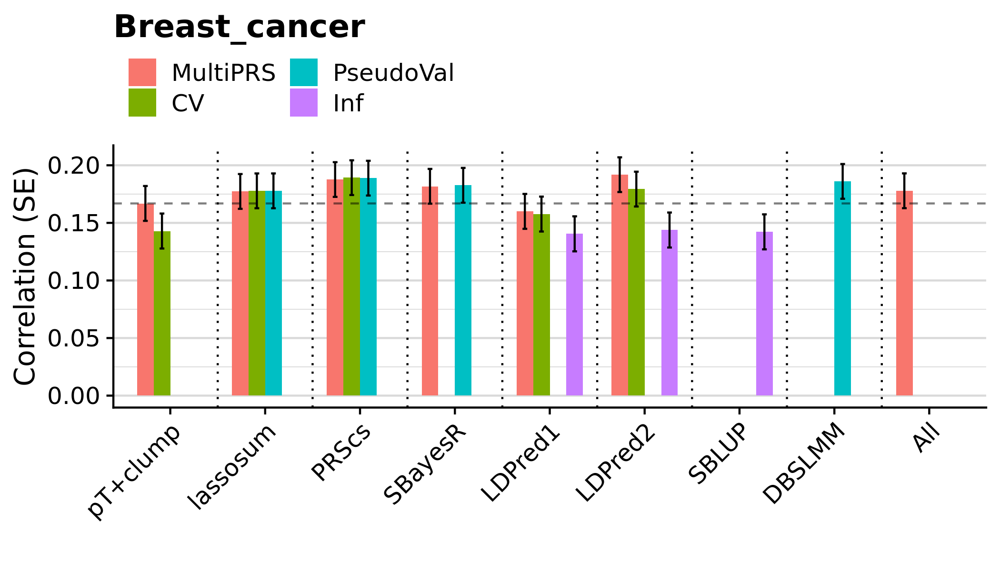

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


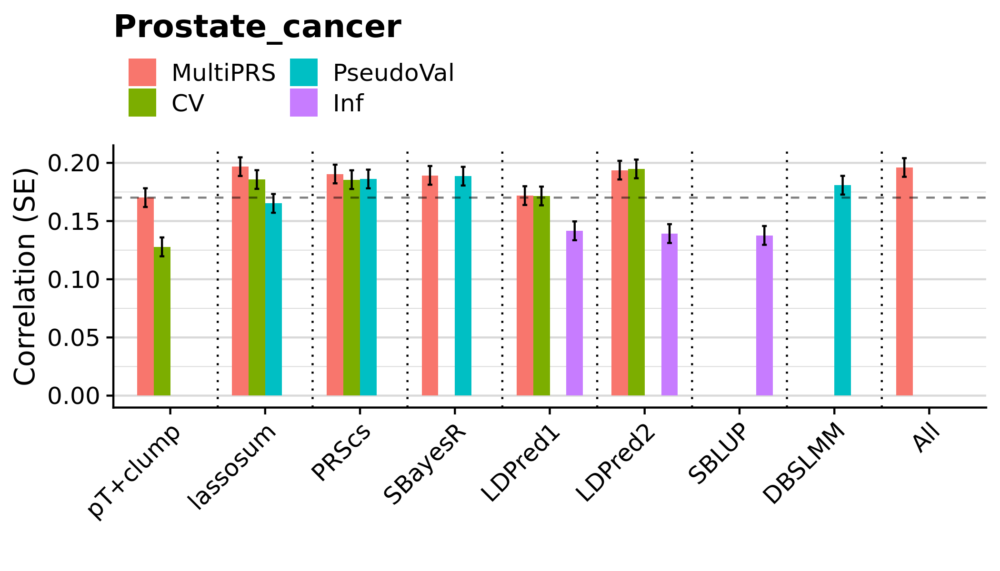

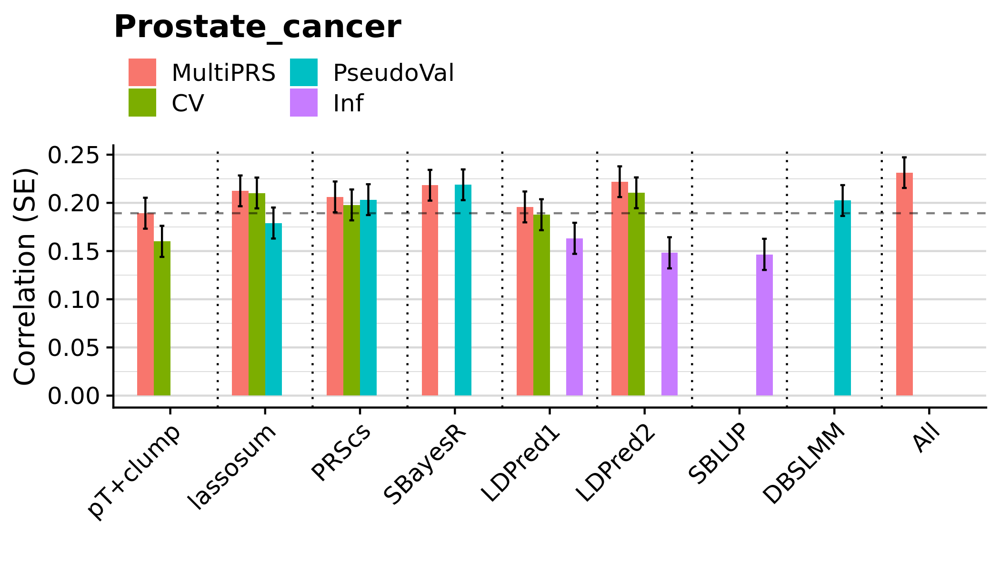

In [89]:
phenos <- unique(md$name)

for (i in seq_along(phenos)){
    
    plotdata <- res_eval[pheno == phenos[i]]
    
    plotdata <- plotdata[,list(Method, Model, CrossVal_R, IndepVal_R, CrossVal_R_SE, IndepVal_R_SE)]
    
    for(j in unique(plotdata$Method)){
      for(k in unique(plotdata$Model)){
        if(dim(plotdata[Method == j & Model == k,])[1] > 0){
          next
        } else {
          dud<-data.frame('Method'=j,
                          'Model'=k,
                          'CrossVal_R'=NA,
                          'CrossVal_R_SE'=NA,
                          'IndepVal_R'=NA,
                          'IndepVal_R_SE'=NA
                          )
          plotdata<-rbind(plotdata,dud)
        }
      }
    }
            
    
    # crossvalidation R
    print(ggplot(plotdata, aes(x=Method, y=CrossVal_R, fill=Model)) +
                          geom_bar(stat="identity", position = position_dodge(preserve = 'single'), width = 0.7) +
                          geom_errorbar(aes(ymin=CrossVal_R-CrossVal_R_SE, ymax=CrossVal_R+CrossVal_R_SE), width=.2, position=position_dodge(preserve = "single", width = 0.7)) +
                          geom_hline(yintercept = plotdata[(Method == 'pT+clump') & (Model == 'MultiPRS')]$CrossVal_R, linetype=2, alpha=0.5) +
                          coord_cartesian(ylim=c(min(plotdata$CrossVal_R-0.02), max(plotdata$CrossVal_R+0.025)), clip="on") +
                          labs(y="Correlation (SE)", x='', title=phenos[i]) +
                          theme_half_open() +
                          theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
                          background_grid(major = 'y', minor = 'y') +
                          geom_vline(xintercept = 1.5, linetype="dotted") +
                          geom_vline(xintercept = 2.5, linetype="dotted") + 
                          geom_vline(xintercept = 3.5, linetype="dotted") + 
                          geom_vline(xintercept = 4.5, linetype="dotted") + 
                          geom_vline(xintercept = 5.5, linetype="dotted") +
                          geom_vline(xintercept = 6.5, linetype="dotted") +
                          geom_vline(xintercept = 7.5, linetype="dotted") +
                          geom_vline(xintercept = 8.5, linetype="dotted") +
                          theme(legend.position="top", legend.title = element_blank(), legend.box="vertical", legend.margin=margin()) +
                          guides(fill=guide_legend(nrow=2))) 

    
    # independent validation set R
    print(ggplot(plotdata,aes(x=Method, y=IndepVal_R, fill=Model)) +
                          geom_bar(stat="identity", position=position_dodge(preserve = "single"), width = 0.7) +
                          geom_errorbar(aes(ymin=IndepVal_R-IndepVal_R_SE, ymax=IndepVal_R+IndepVal_R_SE), width=.2, position=position_dodge(width = 0.7, preserve = "single")) +
                          geom_hline(yintercept = plotdata[(Method == 'pT+clump') & (Model == 'MultiPRS')]$IndepVal_R, linetype=2, alpha=0.5) +
                          labs(y="Correlation (SE)", x='', title=phenos[i]) +
                          coord_cartesian(ylim=c(min(plotdata$IndepVal_R-0.02), max(plotdata$IndepVal_R+0.025)), clip="on") +                          
                          theme_half_open() +
                          theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
                          background_grid(major = 'y', minor = 'y') +
                          background_grid(major = 'y', minor = 'y') +
                          geom_vline(xintercept = 1.5, linetype="dotted") +
                          geom_vline(xintercept = 2.5, linetype="dotted") + 
                          geom_vline(xintercept = 3.5, linetype="dotted") + 
                          geom_vline(xintercept = 4.5, linetype="dotted") + 
                          geom_vline(xintercept = 5.5, linetype="dotted") +
                          geom_vline(xintercept = 6.5, linetype="dotted") +
                          geom_vline(xintercept = 7.5, linetype="dotted") +
                          geom_vline(xintercept = 8.5, linetype="dotted") +
                          theme(legend.position="top", legend.title = element_blank(), legend.box="vertical", legend.margin=margin()) +
                          guides(fill=guide_legend(nrow=2))) 

}

In [90]:
###
# Create plot showing performance of each method compared to pT+clump (MultiPRS)
###

# skip this, the information is fully contained in the plots above...

In [91]:
###
# Create plot showing matrix of differences with significance
###

In [92]:
library(reshape2)


Attaching package: ‘reshape2’


The following objects are masked from ‘package:data.table’:

    dcast, melt




In [93]:
head(res_comp)

Model_1,Model_2,Model_1_Cross_R,Model_2_Cross_R,Cross_R_diff,Cross_R_diff_pval,Model_1_Indep_R,Model_2_Indep_R,Indep_R_diff,Indep_R_diff_pval,study
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
pt.clump,pt.clump,0.1460541,0.1460541,0.000000000,1.000000000,0.1588695,0.1588695,0.00000000,1.000000e+00,GCST007954
pt.clump,lassosum,0.1460541,0.1720687,-0.026014579,0.000796841,0.1588695,0.1916410,-0.03277143,4.893546e-08,GCST007954
pt.clump,prscs,0.1460541,0.1621216,-0.016067538,0.040159000,0.1588695,0.1829953,-0.02412578,1.026042e-04,GCST007954
pt.clump,sbayesr,0.1460541,0.1593196,-0.013265508,0.088062297,0.1588695,0.1729107,-0.01404123,1.163504e-01,GCST007954
pt.clump,ldpred,0.1460541,0.1548220,-0.008767883,0.260743957,0.1588695,0.1827107,-0.02384122,6.204135e-04,GCST007954
pt.clump,ldpred2,0.1460541,0.1656380,-0.019583908,0.011940135,0.1588695,0.1832298,-0.02436032,2.187018e-04,GCST007954


In [94]:
# sanity check: none should be duplicated!
any(duplicated(res_comp[,list(Model_1, Model_2, study)]))

[1] FALSE

In [95]:
res_comp_i_select <- res_comp

In [96]:
res_eval$Model_1 <- gsub('_group','',res_eval$Model_1)

In [97]:
# sanity check, should be FALSE
any(duplicated(unique(res_eval[,list(Model_1,study)])))

[1] FALSE

In [98]:
# sanity check, should be FALSE
any(duplicated(res_eval[,list(Test, study)]))

[1] FALSE

In [99]:
# Comp
res_comp_i_select<-merge(res_comp_i_select, unique(res_eval[,list(Test,Model_1,study)]), by.x=c('Model_1','study'), by.y=c('Model_1', 'study'), all.x = T)

setnames(res_comp_i_select, 'Test', 'Model_1_Test')

In [100]:
# sanity check none should be duplicated!
any(duplicated(res_comp_i_select[,list(Model_1_Test, Model_2, study)]))

[1] FALSE

In [101]:
res_comp_i_select<-merge(res_comp_i_select, res_eval[,list(Test,Model_1,study)], by.x = c('study', 'Model_2'), by.y=c('study', 'Model_1'))

setnames(res_comp_i_select, 'Test', 'Model_2_Test')

In [102]:
res_comp_i_select$Phenotype <- md$name[match(res_comp_i_select$study, md$study_id)]

In [103]:
res_comp_i_select <- res_comp_i_select[,list(Phenotype,Model_1_Test,Model_2_Test,Model_1_Cross_R,Model_2_Cross_R,Cross_R_diff,Cross_R_diff_pval,Model_1_Indep_R,Model_2_Indep_R,Indep_R_diff,Indep_R_diff_pval)]

In [104]:
res_comp_i_select$Cross_R_diff[res_comp_i_select$Model_1_Test == res_comp_i_select$Model_2_Test]<-NA
res_comp_i_select$Indep_R_diff[res_comp_i_select$Model_1_Test == res_comp_i_select$Model_2_Test]<-NA

res_comp_i_select$Cross_R_diff_catagory<-'NA'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff < -0.002]<-'-0.025 - -0.002'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff < -0.025]<-'-0.08 - -0.025'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff < -0.08]<-'< -0.08'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff > -0.002 & res_comp_i_select$Cross_R_diff < 0.002]<-'-0.002 - 0.002'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff > 0.002]<-'0.002 - 0.025'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff > 0.025]<-'0.025 - 0.08'
res_comp_i_select$Cross_R_diff_catagory[res_comp_i_select$Cross_R_diff > 0.08]<-'> 0.08'

res_comp_i_select$Cross_R_diff_catagory<-factor(res_comp_i_select$Cross_R_diff_catagory, level=rev(c('< -0.08','-0.08 - -0.025','-0.025 - -0.002','-0.002 - 0.002','0.002 - 0.025','0.025 - 0.08','> 0.08')))

res_comp_i_select$Indep_R_diff_catagory<-'NA'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff < -0.002]<-'-0.025 - -0.002'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff < -0.025]<-'-0.08 - -0.025'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff < -0.08]<-'< -0.08'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff > -0.002 & res_comp_i_select$Indep_R_diff < 0.002]<-'-0.002 - 0.002'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff > 0.002]<-'0.002 - 0.025'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff > 0.025]<-'0.025 - 0.08'
res_comp_i_select$Indep_R_diff_catagory[res_comp_i_select$Indep_R_diff > 0.08]<-'> 0.08'

res_comp_i_select$Indep_R_diff_catagory<-factor(res_comp_i_select$Indep_R_diff_catagory, level=rev(c('< -0.08','-0.08 - -0.025','-0.025 - -0.002','-0.002 - 0.002','0.002 - 0.025','0.025 - 0.08','> 0.08')))

res_comp_i_select$cross_star<-' '
res_comp_i_select$cross_star[res_comp_i_select$Cross_R_diff_pval < 0.05]<-'*'
res_comp_i_select$cross_star[res_comp_i_select$Cross_R_diff_pval < 1e-3]<-'**'
res_comp_i_select$cross_star[res_comp_i_select$Cross_R_diff_pval < 1e-6]<-'***'

res_comp_i_select$indep_star<-' '
res_comp_i_select$indep_star[res_comp_i_select$Indep_R_diff_pval < 0.05]<-'*'
res_comp_i_select$indep_star[res_comp_i_select$Indep_R_diff_pval < 1e-3]<-'**'
res_comp_i_select$indep_star[res_comp_i_select$Indep_R_diff_pval < 1e-6]<-'***'

In [105]:
library(RColorBrewer)

In [106]:
options(repr.matrix.max.cols=50, repr.matrix.max.rows=100)

In [107]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)

In [108]:
head(plotdata)

Method,Model,CrossVal_R,IndepVal_R,CrossVal_R_SE,IndepVal_R_SE
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
pT+clump,MultiPRS,0.1701278,0.1892604,0.008053726,0.01605193
lassosum,MultiPRS,0.1967515,0.2124641,0.008013118,0.01597415
PRScs,MultiPRS,0.1904320,0.2061870,0.008023310,0.01599612
SBayesR,MultiPRS,0.1892717,0.2182859,0.008025143,0.01595316
LDPred1,MultiPRS,0.1718742,0.1957896,0.008051249,0.01603099
LDPred2,MultiPRS,0.1937537,0.2219684,0.008017996,0.01593957


In [109]:
model_perf <- res_comp_i_select[,list(mean_cross=mean(Model_1_Cross_R), mean_indep=mean(Model_1_Indep_R)), by=list(Model_1_Test)]
model_perf <- model_perf[order(mean_indep, decreasing=T)]
res_comp_i_select$Model_1_Test <- factor(res_comp_i_select$Model_1_Test, levels=rev(model_perf$Model_1_Test))
res_comp_i_select$Model_2_Test <- factor(res_comp_i_select$Model_2_Test, levels=rev(model_perf$Model_1_Test))

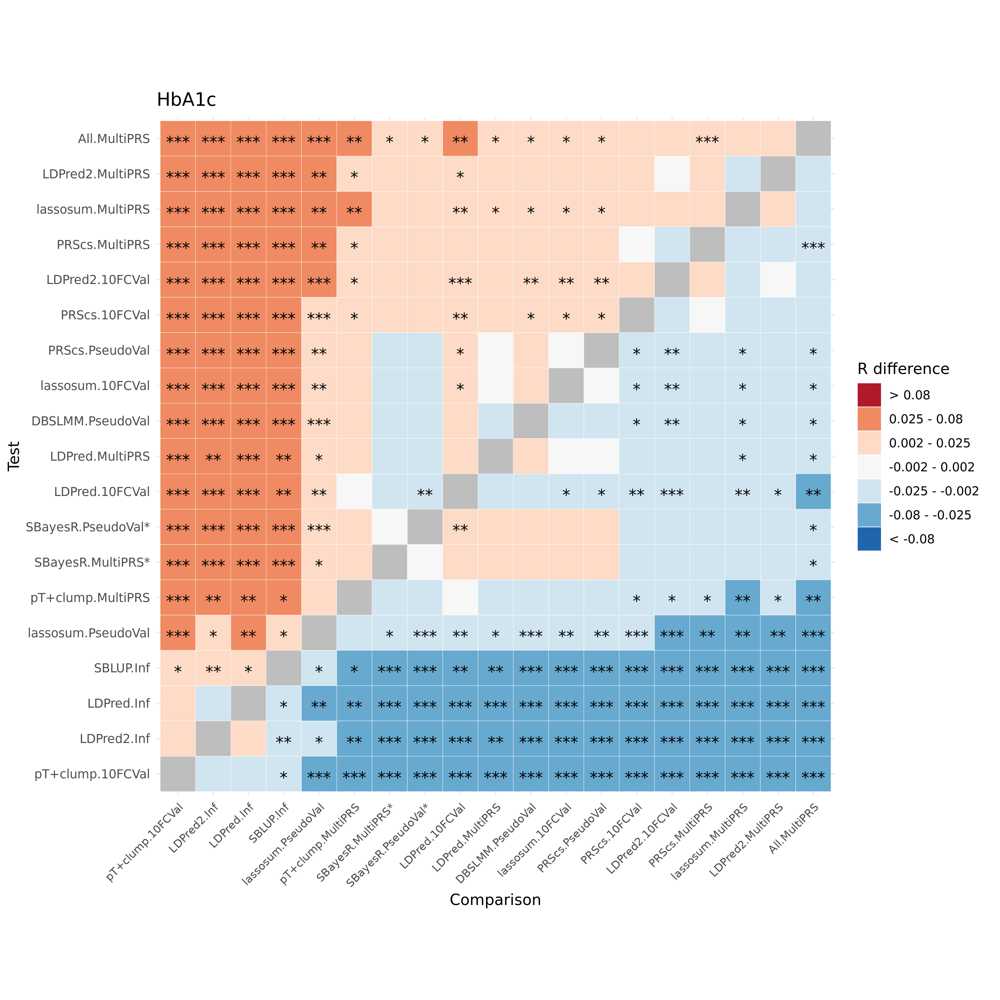

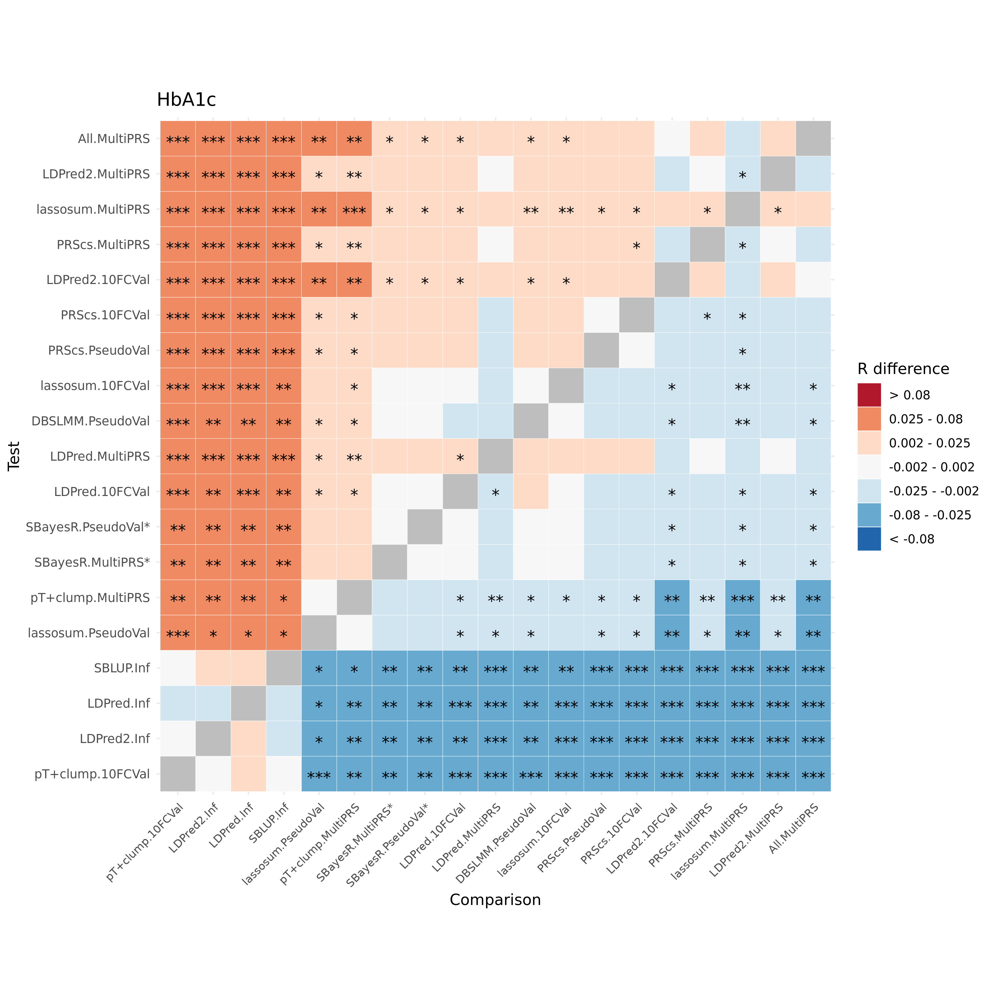

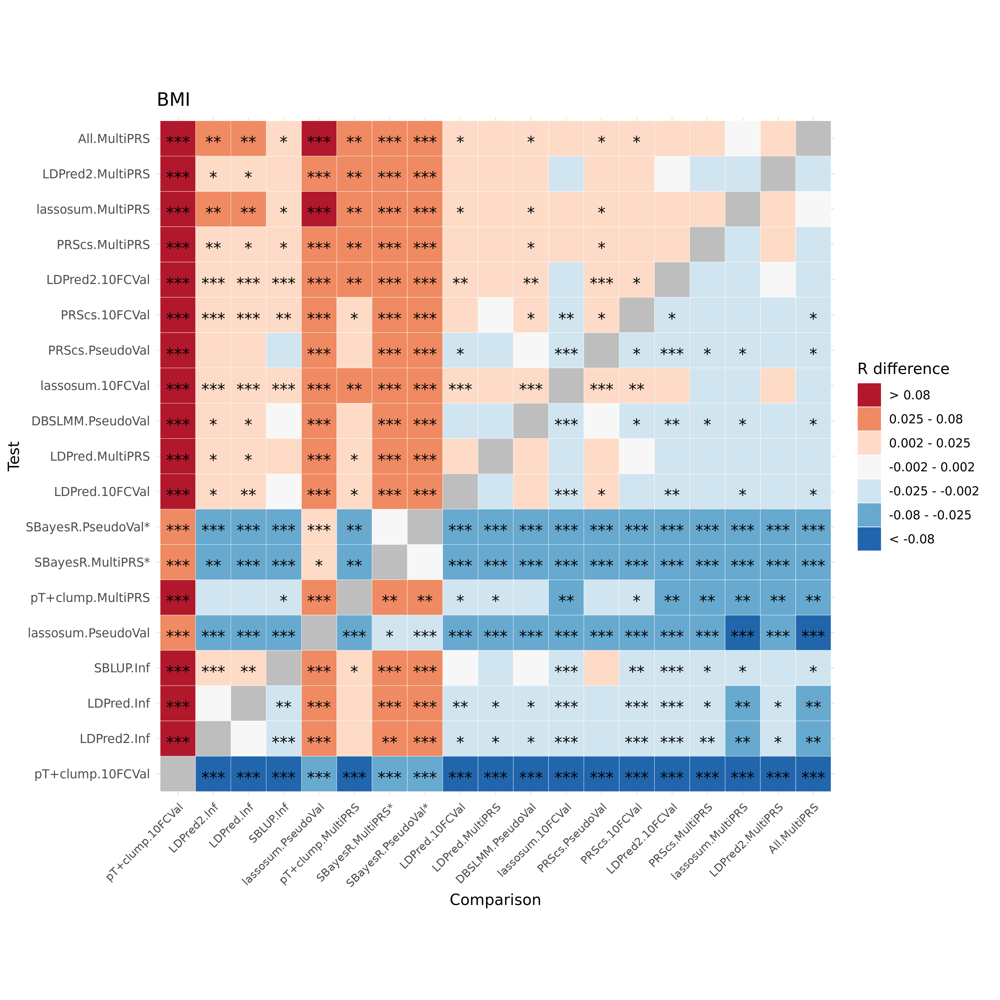

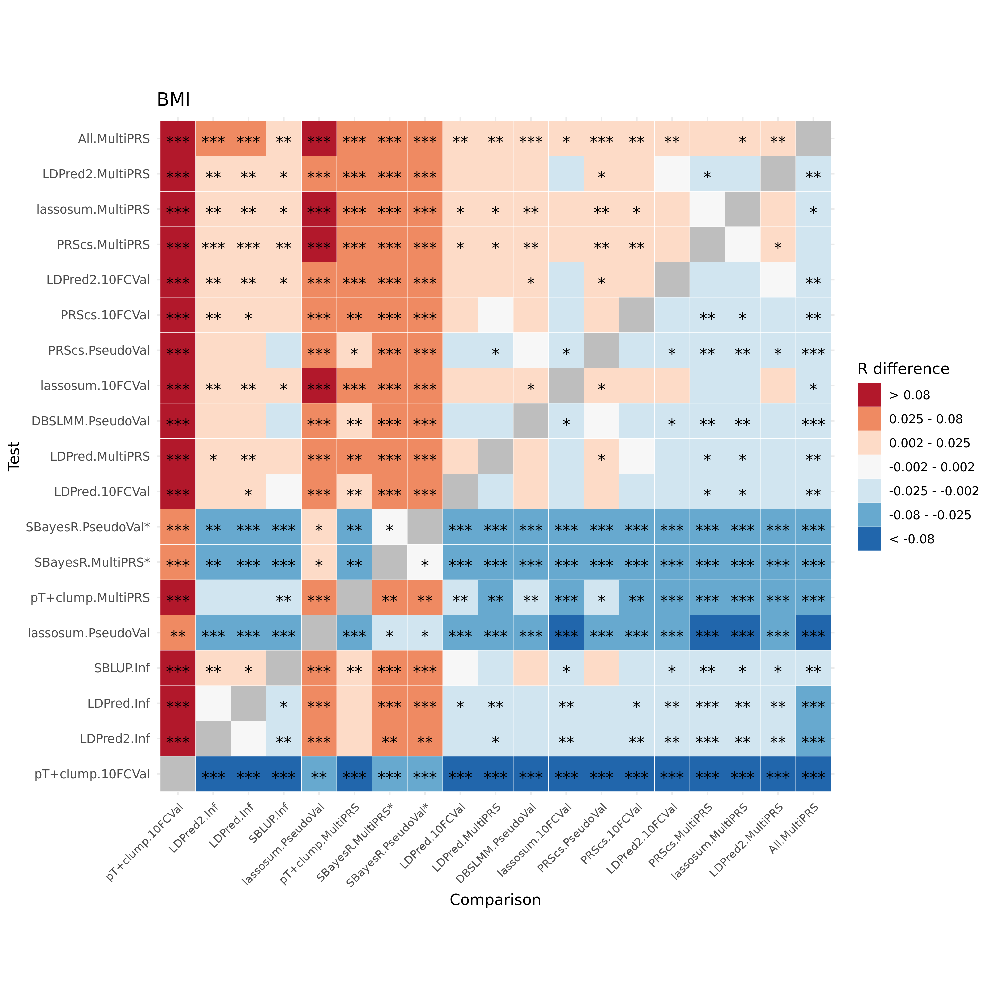

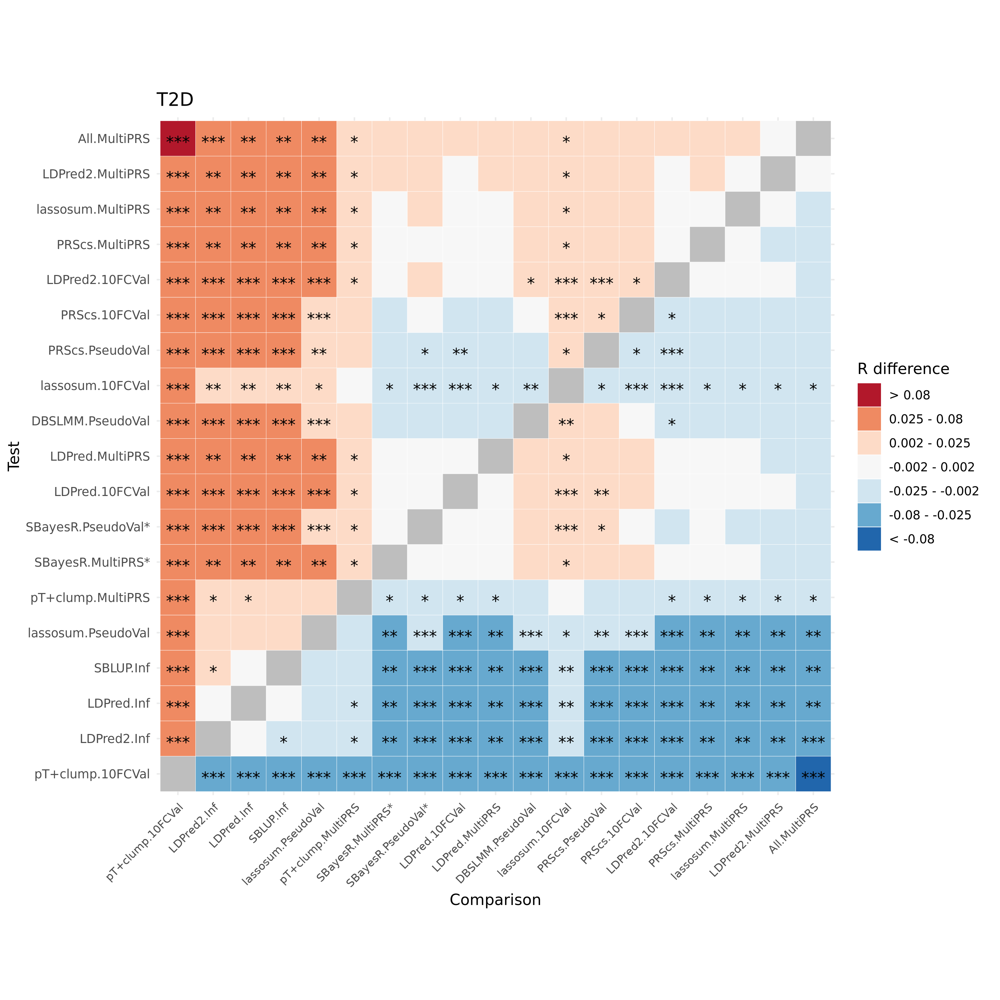

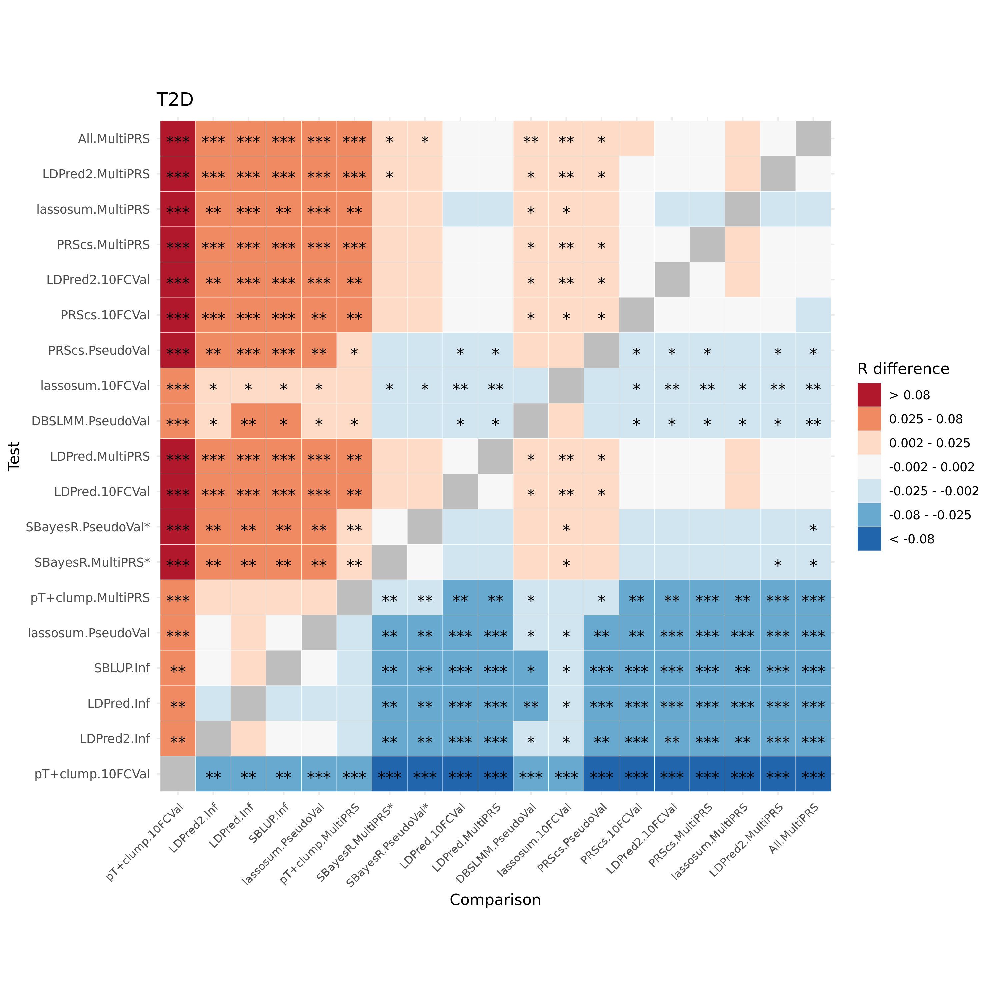

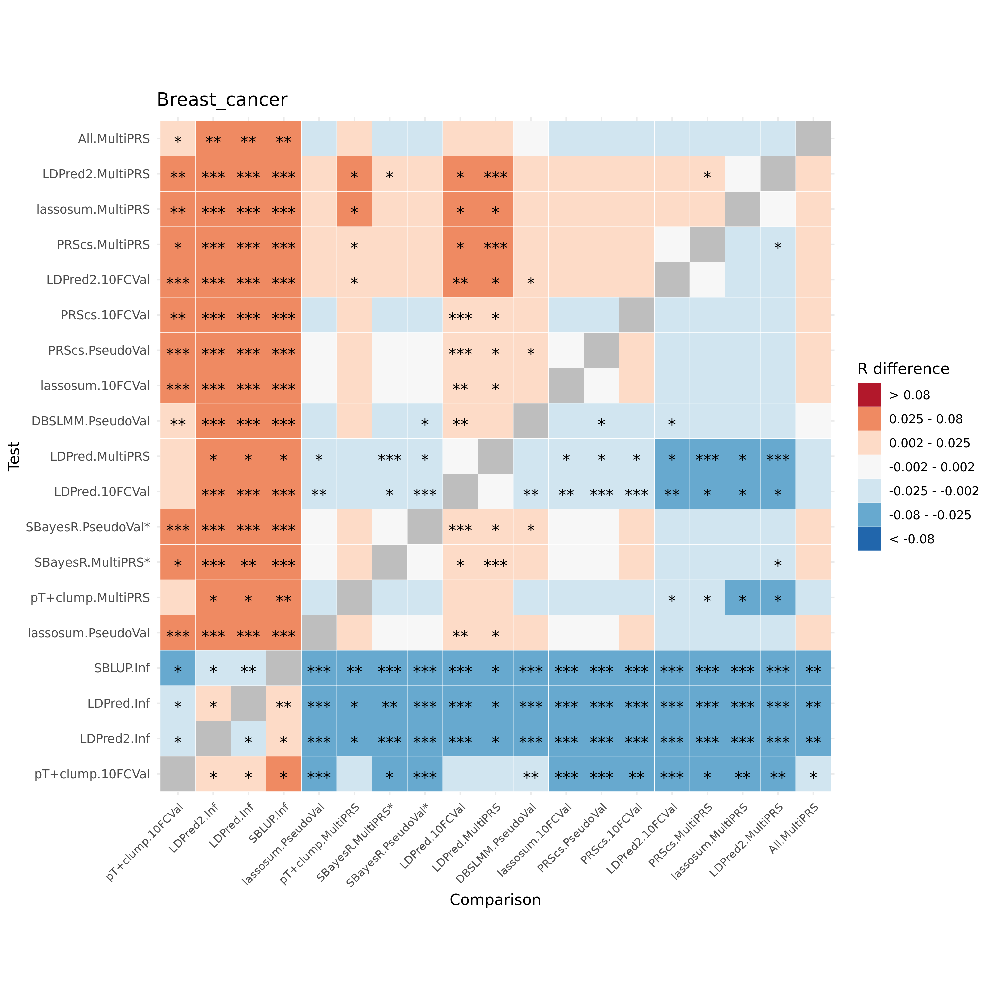

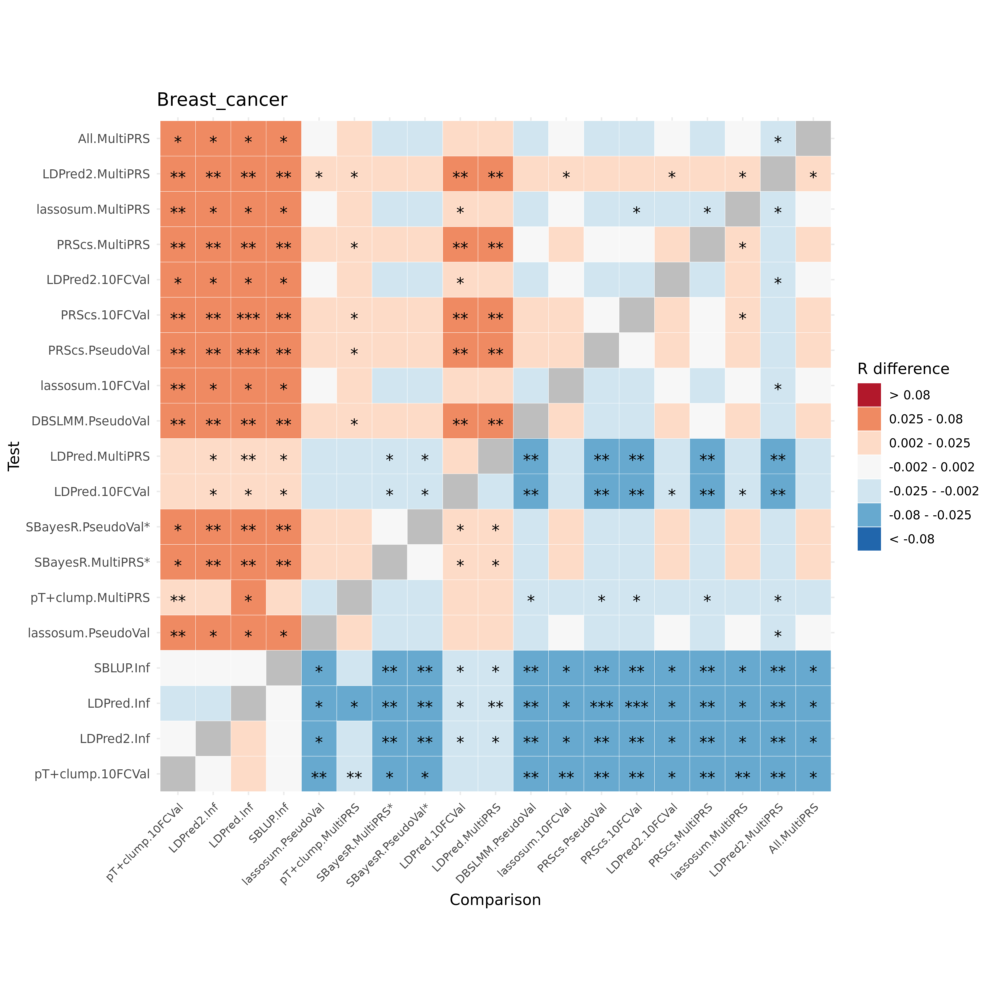

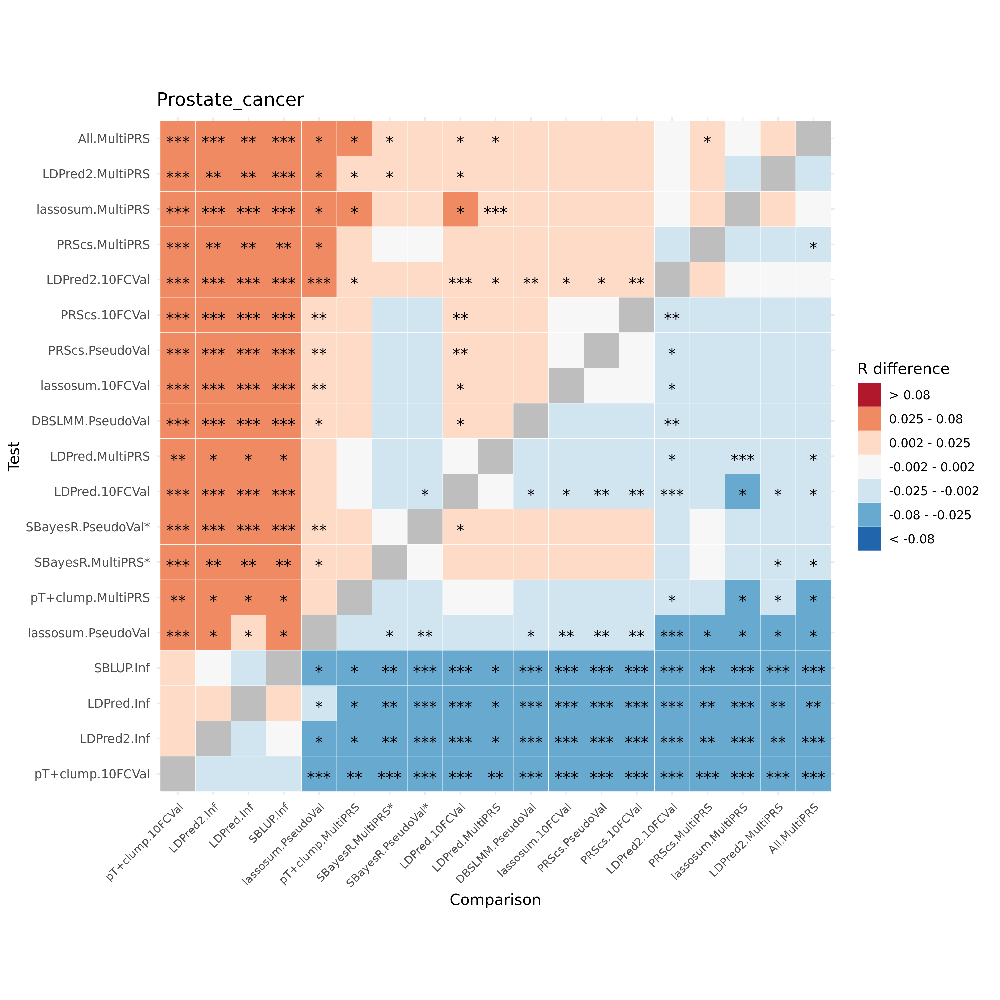

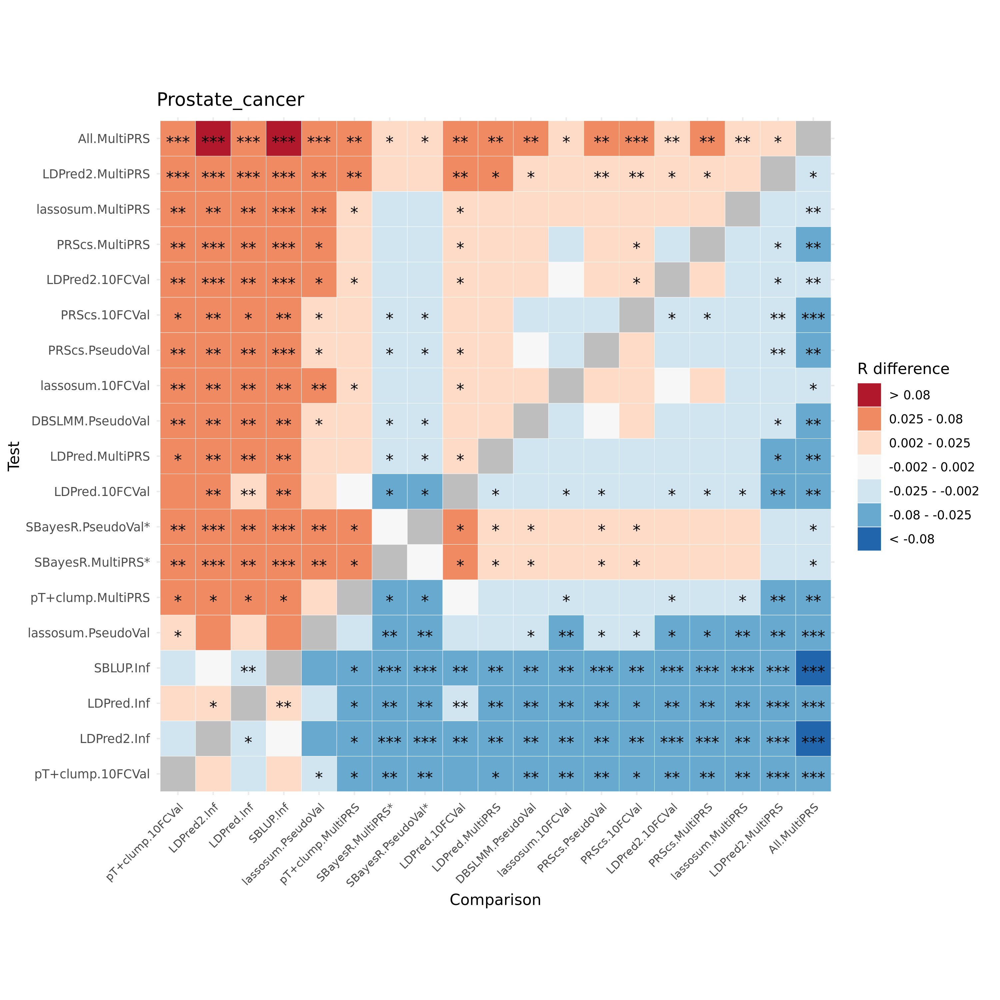

In [110]:
for (i in seq_along(phenos)){
    
    plotdata <- res_comp_i_select[Phenotype == phenos[i]]

    print(
        ggplot(data = plotdata, aes(Model_2_Test, Model_1_Test, fill=Cross_R_diff_catagory))+
        geom_tile(color = "white")+
        labs(y='Test', x='Comparison', title=phenos[i], fill='R difference') +
        theme_minimal()+ 
        theme(axis.text.x = element_text(angle = 45, vjust = 1, 
        size = 8, hjust = 1))+
        coord_fixed() +
        geom_text(data=plotdata, aes(Model_2_Test, Model_1_Test, label = cross_star), color = "black", size = 4, angle = 0, vjust=0.8) +
        scale_fill_brewer(breaks = levels(plotdata$Indep_R_diff_catagory), palette = "RdBu", drop=F, na.value='grey')
    )

    print(
        ggplot(data = plotdata, aes(Model_2_Test, Model_1_Test, fill=Indep_R_diff_catagory))+
         geom_tile(color = "white")+
         labs(y='Test', x='Comparison', title=phenos[i], fill='R difference') +
         theme_minimal()+ 
         theme(axis.text.x = element_text(angle = 45, vjust = 1, 
         size = 8, hjust = 1))+
         coord_fixed() +
        geom_text(data=plotdata, aes(Model_2_Test, Model_1_Test, label = indep_star), color = "black", size = 4, angle = 0, vjust=0.8) +
        scale_fill_brewer(breaks = levels(plotdata$Indep_R_diff_catagory), palette = "RdBu", drop=F, na.value='grey')
    )
  }

In [111]:
res_eval<-res_eval[order(res_eval$Phenotype, res_eval$Method, res_eval$Model),]

In [112]:
###################
# Average results across phenotypes, creates tables and figures
###################

In [113]:
pheno <- md$name

In [114]:
for(pheno_i in 1:length(pheno)){
    if(pheno_i==1){
      pheno_i_dat<-fread(paste0(UKBB_output,'/Phenotype/PRS_comp_subset/UKBB.',pheno[pheno_i],'.subsample.txt'))
      names(pheno_i_dat)<-c('FID','IID',pheno[pheno_i])
      pheno_dat<-pheno_i_dat
    } else {
      pheno_i_dat<-fread(paste0(UKBB_output,'/Phenotype/PRS_comp_subset/UKBB.',pheno[pheno_i],'.subsample.txt'))
      names(pheno_i_dat)<-c('FID','IID',pheno[pheno_i])
      pheno_dat<-merge(pheno_dat, pheno_i_dat, by=c('FID','IID'), all=T)
    }
  }

In [115]:
# Calculate corelation between all phenotypes
cors<-abs(cor(as.matrix(pheno_dat[,-1:-2]), use='p'))
cors<-cors[unique(res_eval$Phenotype,),unique(res_eval$Phenotype,)]
cors[is.na(cors)]<-0

In [116]:
# TODO: add to dependencies
library('MAd')

In [117]:
meta_res_eval<-NULL
for(i in unique(res_eval$Test)){
    res_eval_i<-res_eval[res_eval$Test == i,]
    res_eval_i$Sample<-'Target'
    
    cors_i<-cors[(dimnames(cors)[[1]] %in% res_eval_i$Phenotype),(dimnames(cors)[[1]] %in% res_eval_i$Phenotype)]

    CrossVal_agg_res_eval_i<-agg(id=Sample, es=CrossVal_R, var=CrossVal_R_SE^2, cor=cors_i, method="BHHR", mod=NULL, data=res_eval_i)
    IndepVal_agg_res_eval_i<-agg(id=Sample, es=IndepVal_R, var=IndepVal_R_SE^2, cor=cors_i, method="BHHR", mod=NULL, data=res_eval_i)
  
    meta_res_eval<-rbind(meta_res_eval, data.frame(  Test=i,
                                           CrossVal_R=CrossVal_agg_res_eval_i$es[1],
                                           CrossVal_R_SE=sqrt(CrossVal_agg_res_eval_i$var[1]),
                                           IndepVal_R=IndepVal_agg_res_eval_i$es[1],
                                           IndepVal_R_SE=sqrt(IndepVal_agg_res_eval_i$var[1])))
}

In [118]:
res_comp<-res_comp_i_select

In [119]:
# Calculate difference between methods and p-value using aggregate
# Truncate difference p-values to stop 0 values
res_comp$Cross_R_diff_pval[res_comp$Cross_R_diff_pval == 0]<-1e-320
res_comp$Indep_R_diff_pval[res_comp$Indep_R_diff_pval == 0]<-1e-320

meta_res_diff<-NULL
for(i in unique(res_eval$Test)){
  for(k in unique(res_eval$Test)){
    meta_res_eval_i<-meta_res_eval[meta_res_eval$Test == i,]
    meta_res_eval_k<-meta_res_eval[meta_res_eval$Test == k,]

    res_comp_i_k<-res_comp[res_comp$Model_1_Test == i & res_comp$Model_2_Test == k,]
    
    # Calculate diff SE based on p-value
    for(j in 1:dim(res_comp_i_k)[1]){
      if(res_comp_i_k$Cross_R_diff_pval[j] == 1){
        res_comp_i_k$Cross_R_diff_pval[j]<-1-0.001
      }
      if(res_comp_i_k$Indep_R_diff_pval[j] == 1){
        res_comp_i_k$Indep_R_diff_pval[j]<-1-0.001
      }
    }

    res_comp_i_k$Cross_R_diff_z<-qnorm(res_comp_i_k$Cross_R_diff_pval/2)
    res_comp_i_k$Cross_R_diff_SE<-res_comp_i_k$Cross_R_diff/res_comp_i_k$Cross_R_diff_z

    res_comp_i_k$Indep_R_diff_z<-qnorm(res_comp_i_k$Indep_R_diff_pval/2)
    res_comp_i_k$Indep_R_diff_SE<-res_comp_i_k$Indep_R_diff/res_comp_i_k$Indep_R_diff_z
    
    res_comp_i_k$Sample<-'A'
    
    cors_i<-cors[(dimnames(cors)[[1]] %in% res_comp_i_k$Phenotype),(dimnames(cors)[[1]] %in% res_comp_i_k$Phenotype)]

    CrossVal_agg_res_comp_i_k<-agg(id=Sample, es=Cross_R_diff, var=Cross_R_diff_SE^2, cor=cors_i, method="BHHR", mod=NULL, data=res_comp_i_k)
    
    IndepVal_agg_res_eval_i<-agg(id=Sample, es=Indep_R_diff, var=Indep_R_diff_SE^2, cor=cors_i, method="BHHR", mod=NULL, data=res_comp_i_k)
  
    meta_res_diff<-rbind(meta_res_diff, data.frame(Test_ref=i,
                                                   Test_targ=k,
                                                   CrossVal_R_diff=CrossVal_agg_res_comp_i_k$es[1],
                                                   CrossVal_R_diff_SE=sqrt(CrossVal_agg_res_comp_i_k$var[1]),
                                                   IndepVal_R_diff=IndepVal_agg_res_eval_i$es[1],
                                                   IndepVal_R_diff_SE=sqrt(IndepVal_agg_res_eval_i$var[1])))
  }
}

In [120]:
meta_res_diff$CrossVal_R_diff_Z<-meta_res_diff$CrossVal_R_diff/meta_res_diff$CrossVal_R_diff_SE
meta_res_diff$CrossVal_R_diff_P<-2*pnorm(-abs(meta_res_diff$CrossVal_R_diff_Z))              
meta_res_diff$IndepVal_R_diff_Z<-meta_res_diff$IndepVal_R_diff/meta_res_diff$IndepVal_R_diff_SE
meta_res_diff$IndepVal_R_diff_P<-2*pnorm(-abs(meta_res_diff$IndepVal_R_diff_Z))              
meta_res_diff<-meta_res_diff[,c("Test_ref","Test_targ","CrossVal_R_diff","CrossVal_R_diff_Z","CrossVal_R_diff_P","IndepVal_R_diff","IndepVal_R_diff_Z","IndepVal_R_diff_P")]

meta_res_diff$CrossVal_R_diff_Z[meta_res_diff$CrossVal_R_diff == 0]<-0
meta_res_diff$CrossVal_R_diff_P[meta_res_diff$CrossVal_R_diff == 0]<-1
meta_res_diff$IndepVal_R_diff_Z[meta_res_diff$IndepVal_R_diff == 0]<-0
meta_res_diff$IndepVal_R_diff_P[meta_res_diff$IndepVal_R_diff == 0]<-1

# Calculate percentage improvement
meta_res_diff$CrossVal_R_diff_perc<-NA
for(i in unique(meta_res_diff$Test_ref)){
  meta_res_diff$CrossVal_R_diff_perc[meta_res_diff$Test_ref == i]<-meta_res_diff$CrossVal_R_diff[meta_res_diff$Test_ref == i]/meta_res_eval$CrossVal_R[meta_res_eval$Test == i]*100
}

meta_res_diff$IndepVal_R_diff_perc<-NA
for(i in unique(meta_res_diff$Test_ref)){
  meta_res_diff$IndepVal_R_diff_perc[meta_res_diff$Test_ref == i]<-meta_res_diff$IndepVal_R_diff[meta_res_diff$Test_ref == i]/meta_res_eval$IndepVal_R[meta_res_eval$Test == i]*100
}

In [121]:
res_eval_bckp <- res_eval

In [122]:
###
# Create plot showing performance of each method
###

# To avoid unequal groups, insert NA for missing Model/Method pairs
meta_res_eval$Method<-gsub('\\..*','',meta_res_eval$Test)
meta_res_eval$Model<-gsub('.*\\.','',meta_res_eval$Test)

In [123]:
meta_res_eval$Model<-gsub('\\*','',meta_res_eval$Model)

In [124]:
table(meta_res_eval$Model)


  10FCVal       Inf  MultiPRS PseudoVal 
        5         3         7         4 

In [125]:
table(meta_res_eval$Method)


     All   DBSLMM lassosum   LDPred  LDPred2    PRScs pT+clump  SBayesR 
       1        1        3        3        3        3        2        2 
   SBLUP 
       1 

In [126]:
meta_res_eval$Method<-factor(meta_res_eval$Method, levels=c("pT+clump",'lassosum','PRScs','SBLUP','SBayesR','LDPred','LDPred2','DBSLMM','All'))
meta_res_eval$Model<-factor(meta_res_eval$Model, levels=c('MultiPRS','10FCVal','PseudoVal','Inf'))

In [127]:
###
# Create plot showing performance of each method
###


for(i in unique(meta_res_eval$Method)){
  for(k in unique(meta_res_eval$Model)){
    if(dim(meta_res_eval[meta_res_eval$Method == i & meta_res_eval$Model == k,])[1] > 0){
      next
    } else {
      dud<-data.frame(Test=NA,
                      CrossVal_R=NA,
                      CrossVal_R_SE=NA,
                      IndepVal_R=NA,
                      IndepVal_R_SE=NA,
                      Method=i,
                      Model=k)
      meta_res_eval<-rbind(meta_res_eval,dud)
    }
  }
}

res_eval<-res_eval[,c('Phenotype','Test','CrossVal_R','IndepVal_R','Method','Model')]

for(i in unique(res_eval$Method)){
  for(k in unique(res_eval$Model)){
    if(dim(res_eval[res_eval$Method == i & res_eval$Model == k,])[1] > 0){
      next
    } else {
      dud<-data.frame(Phenotype=NA,
                      Test=paste0(i,'.',k),
                      CrossVal_R=NA,
                      IndepVal_R=NA,
                      Method=i,
                      Model=k)
      res_eval<-rbind(res_eval,dud)
    }
  }
}

In [128]:
options(repr.plot.width=7, repr.plot.height=4, repr.plot.res=300)

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


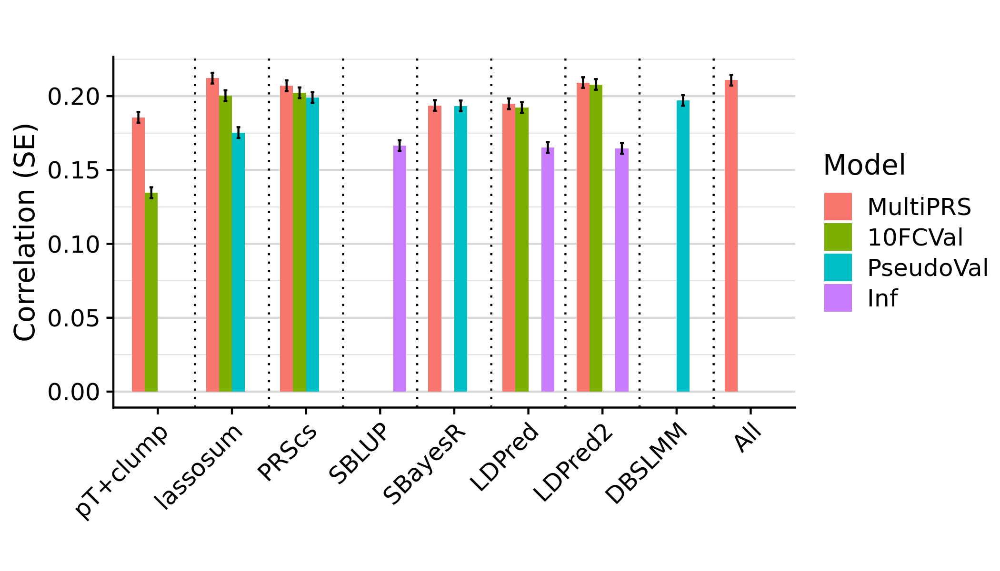

In [129]:
ggplot( meta_res_eval, aes(x=Method, y=CrossVal_R, fill=Model)) +
        geom_bar(stat="identity", position=position_dodge(preserve = "single"), width = 0.7) +
        geom_errorbar(aes(ymin=CrossVal_R-CrossVal_R_SE, ymax=CrossVal_R+CrossVal_R_SE), width=.2, position=position_dodge(width = 0.7, preserve = "single")) +
        labs(y="Correlation (SE)", x='', title='') +
        theme_half_open() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
        geom_vline(xintercept = 1.5, linetype="dotted") +
        geom_vline(xintercept = 2.5, linetype="dotted") + 
        geom_vline(xintercept = 3.5, linetype="dotted") + 
        geom_vline(xintercept = 4.5, linetype="dotted") + 
        geom_vline(xintercept = 5.5, linetype="dotted") +
        geom_vline(xintercept = 6.5, linetype="dotted") +
        geom_vline(xintercept = 7.5, linetype="dotted") +
        geom_vline(xintercept = 8.5, linetype="dotted") +
        background_grid(major = 'y', minor = 'y')

Warning message:
“Removed 17 rows containing missing values (geom_bar).”


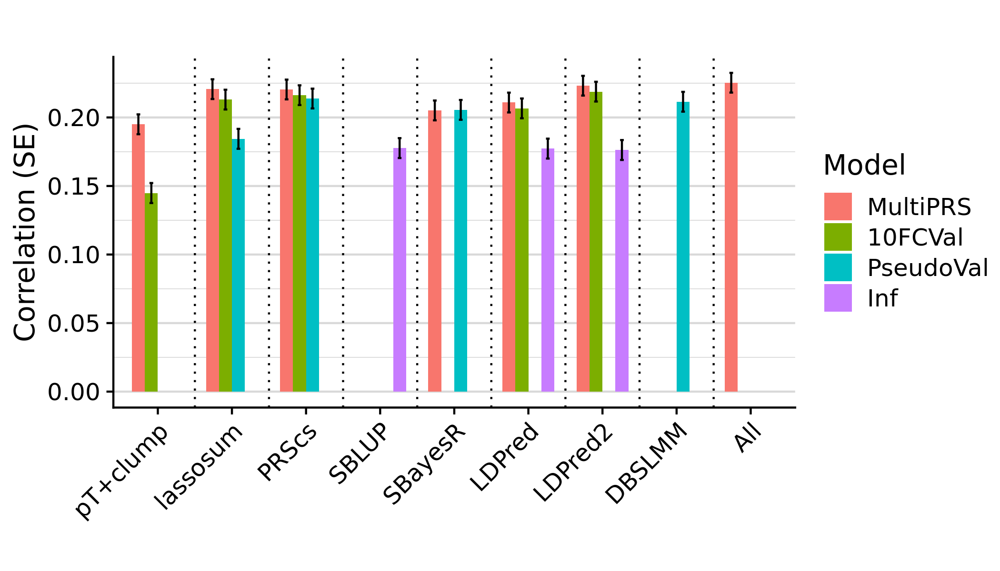

In [130]:
ggplot( meta_res_eval, aes(x=Method, y=IndepVal_R, fill=Model)) +
        geom_bar(stat="identity", position=position_dodge(preserve = "single"), width = 0.7) +
        geom_errorbar(aes(ymin=IndepVal_R-IndepVal_R_SE, ymax=IndepVal_R+IndepVal_R_SE), width=.2, position=position_dodge(width = 0.7, preserve = "single")) +
        labs(y="Correlation (SE)", x='', title='') +
        theme_half_open() +
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
        geom_vline(xintercept = 1.5, linetype="dotted") +
        geom_vline(xintercept = 2.5, linetype="dotted") + 
        geom_vline(xintercept = 3.5, linetype="dotted") + 
        geom_vline(xintercept = 4.5, linetype="dotted") + 
        geom_vline(xintercept = 5.5, linetype="dotted") +
        geom_vline(xintercept = 6.5, linetype="dotted") +
        geom_vline(xintercept = 7.5, linetype="dotted") +
        geom_vline(xintercept = 8.5, linetype="dotted") +
        background_grid(major = 'y', minor = 'y')

In [131]:
###
# Create plot showing matrix of differences with significance
###

meta_res_diff$CrossVal_R_diff[meta_res_diff$Test_ref == meta_res_diff$Test_targ]<-NA
meta_res_diff$IndepVal_R_diff[meta_res_diff$Test_ref == meta_res_diff$Test_targ]<-NA

meta_res_diff$Cross_R_diff_catagory<-'NA'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff < -0.002]<-'-0.025 - -0.002'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff < -0.025]<-'-0.08 - -0.025'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff < -0.08]<-'< -0.08'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff > -0.002 & meta_res_diff$CrossVal_R_diff < 0.002]<-'-0.002 - 0.002'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff > 0.002]<-'0.002 - 0.025'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff > 0.025]<-'0.025 - 0.08'
meta_res_diff$Cross_R_diff_catagory[meta_res_diff$CrossVal_R_diff > 0.08]<-'> 0.08'

meta_res_diff$Cross_R_diff_catagory<-factor(meta_res_diff$Cross_R_diff_catagory, level=rev(c('< -0.08','-0.08 - -0.025','-0.025 - -0.002','-0.002 - 0.002','0.002 - 0.025','0.025 - 0.08','> 0.08')))

meta_res_diff$Indep_R_diff_catagory<-'NA'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff < -0.002]<-'-0.025 - -0.002'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff < -0.025]<-'-0.08 - -0.025'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff < -0.08]<-'< -0.08'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff > -0.002 & meta_res_diff$IndepVal_R_diff < 0.002]<-'-0.002 - 0.002'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff > 0.002]<-'0.002 - 0.025'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff > 0.025]<-'0.025 - 0.08'
meta_res_diff$Indep_R_diff_catagory[meta_res_diff$IndepVal_R_diff > 0.08]<-'> 0.08'

meta_res_diff$Indep_R_diff_catagory<-factor(meta_res_diff$Indep_R_diff_catagory, level=rev(c('< -0.08','-0.08 - -0.025','-0.025 - -0.002','-0.002 - 0.002','0.002 - 0.025','0.025 - 0.08','> 0.08')))

meta_res_diff$cross_star<-' '
meta_res_diff$cross_star[meta_res_diff$CrossVal_R_diff_P < 0.05]<-'*'
meta_res_diff$cross_star[meta_res_diff$CrossVal_R_diff_P < 1e-3]<-'**'
meta_res_diff$cross_star[meta_res_diff$CrossVal_R_diff_P < 1e-6]<-'***'

meta_res_diff$indep_star<-' '
meta_res_diff$indep_star[meta_res_diff$IndepVal_R_diff_P < 0.05]<-'*'
meta_res_diff$indep_star[meta_res_diff$IndepVal_R_diff_P < 1e-3]<-'**'
meta_res_diff$indep_star[meta_res_diff$IndepVal_R_diff_P < 1e-6]<-'***'

In [132]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)

In [134]:
meta_res_diff$Test_ref <- factor(meta_res_diff$Test_ref, levels=rev(model_perf$Model_1_Test))
meta_res_diff$Test_targ <- factor(meta_res_diff$Test_targ, levels=rev(model_perf$Model_1_Test))

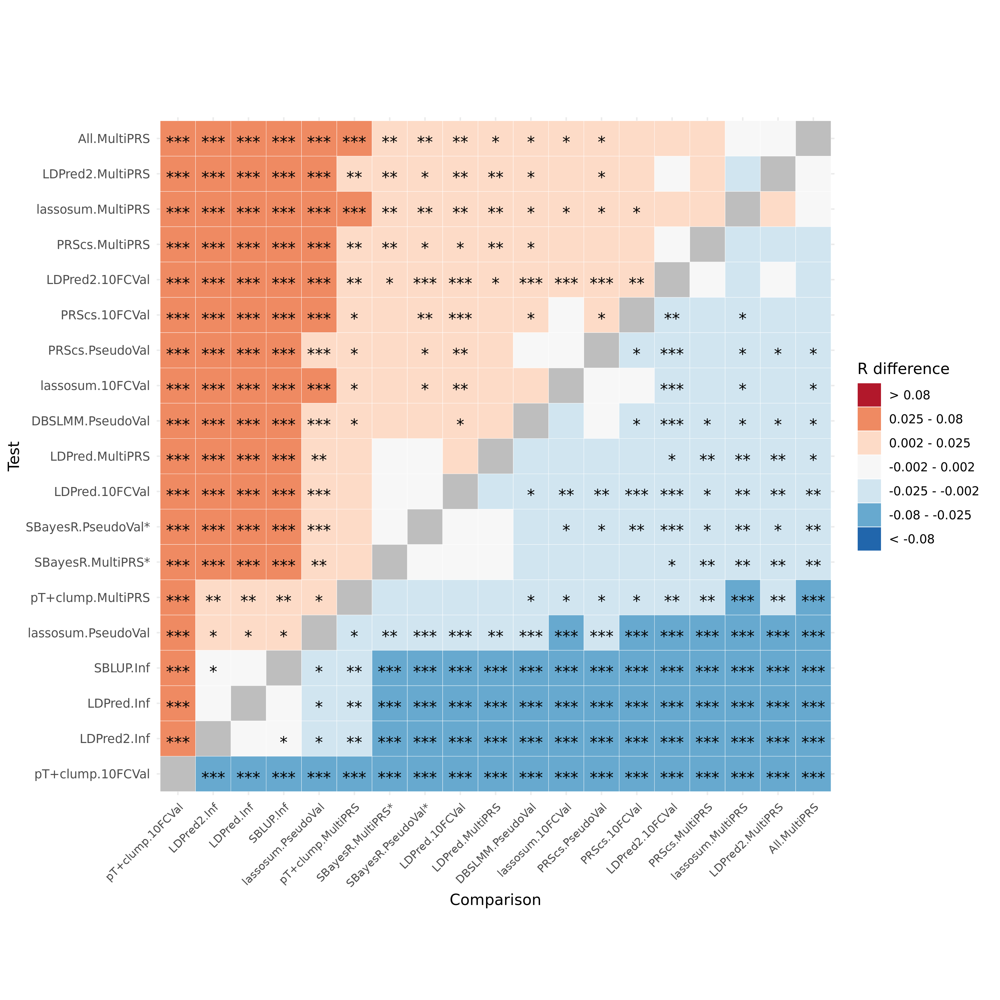

In [135]:
ggplot(data = meta_res_diff, aes(Test_targ, Test_ref, fill=Cross_R_diff_catagory))+
    geom_tile(color = "white")+
    labs(y='Test', x='Comparison', title='', fill='R difference') +
    theme_minimal()+ 
    theme(axis.text.x = element_text(angle = 45, vjust = 1, 
    size = 8, hjust = 1)) +
    coord_fixed() +
    geom_text(data=meta_res_diff, aes(Test_ref, Test_targ, label = cross_star), color = "black", size = 4, angle = 0, vjust=0.8) +
    scale_fill_brewer(breaks = levels(meta_res_diff$Cross_R_diff_catagory), palette = "RdBu", drop=F, na.value='grey')

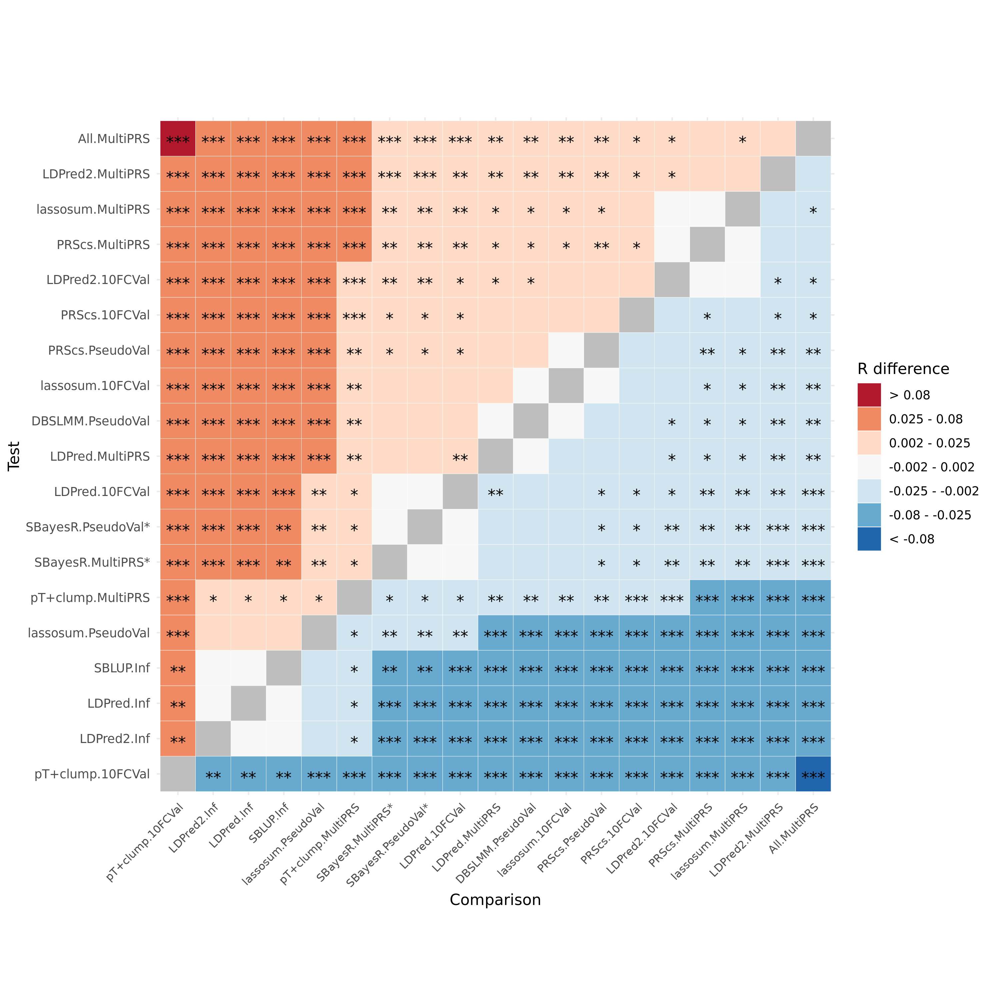

In [136]:
ggplot(data = meta_res_diff, aes(Test_targ, Test_ref, fill=Indep_R_diff_catagory))+
    geom_tile(color = "white")+
    labs(y='Test', x='Comparison', title='', fill='R difference') +
    theme_minimal()+ 
    theme(axis.text.x = element_text(angle = 45, vjust = 1, 
    size = 8, hjust = 1))+
    coord_fixed()+
    geom_text(data=meta_res_diff, aes(Test_targ, Test_ref, label = indep_star), color = "black", size = 4, angle = 0, vjust=0.8) +
    scale_fill_brewer(breaks = levels(meta_res_diff$Indep_R_diff_catagory), palette = "RdBu", drop=F, na.value='grey')

## Looking at the range of optimal parameter values

In [138]:
##
# parameter ranges as defined in the separate polygenic score file creator scripts
##

# pT + clump
# default values for the p-value thresholds
# '1e-8,1e-6,1e-4,1e-2,0.1,0.2,0.3,0.4,0.5,1'


# p-value threshold is the only variable that is optimized 


In [139]:
ptclump_i <- grep('pt\\.clump\\.PredFile[0-9]+', res_pred_eval$Model, value = F)

In [140]:
ptclump_predfiles <- res_pred_eval$Model[ptclump_i]

In [141]:
ptclump_pTs <- gsub('pt\\.clump\\.PredFile[0-9]+\\.[A-Z,a-z,0-9]+\\.', '', ptclump_predfiles)
ptclump_pTs <- gsub('_group','',ptclump_pTs)
ptclump_pTs <- gsub('e\\.','e-',ptclump_pTs)
ptclump_pTs <- as.numeric(ptclump_pTs)

In [142]:
ptclump_pTs

[1] 1e-08 1e-06 1e-04 1e-02 1e-01 2e-01 3e-01 4e-01 5e-01 1e+00 1e-08 1e-06
[13] 1e-04 1e-02 1e-01 2e-01 3e-01 4e-01 5e-01 1e+00 1e-08 1e-06 1e-04 1e-02
[25] 1e-01 2e-01 3e-01 4e-01 5e-01 1e+00 1e-08 1e-06 1e-04 1e-02 1e-01 2e-01
[37] 3e-01 4e-01 5e-01 1e+00 1e-08 1e-06 1e-04 1e-02 1e-01 2e-01 3e-01 4e-01
[49] 5e-01 1e+00

In [143]:
plotdata <- res_pred_eval[ptclump_i]
plotdata$pvalue_threshold <- ptclump_pTs

In [144]:
plotdata<-melt(plotdata, id.vars = c('pheno','study','pvalue_threshold'), measure.vars = c('CrossVal_R', 'IndepVal_R'))

In [145]:
options(repr.plot.width=10, repr.plot.height=3, repr.plot.res=300)

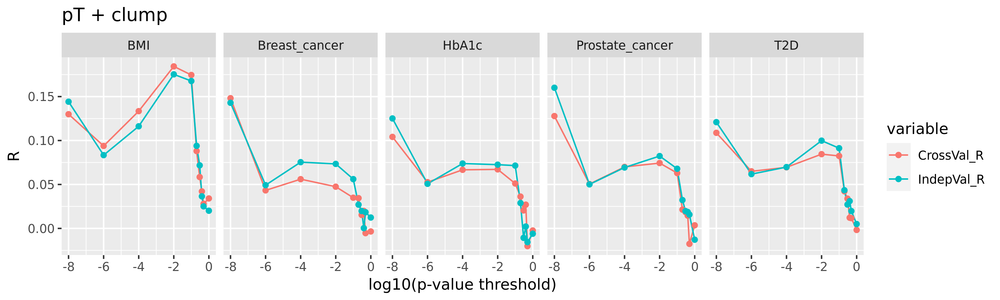

In [146]:
ggplot(plotdata, aes(x=log10(pvalue_threshold), y=value, col=variable))  + geom_line(aes(group=variable)) + geom_point() + facet_wrap(~pheno, nrow = 1) + labs(title = 'pT + clump') + xlab('log10(p-value threshold)') + ylab('R')

In [147]:
# lassosum 
# infer from file names

# s -> mixing parameter (?)
# lambda -> weight of L1 penalty (?)

lassosum_i <- grep('lassosum.PredFile', res_pred_eval$Model)

lassosum_lambda <- res_pred_eval$Model[lassosum_i]



In [148]:
lassosum_s <- as.numeric(gsub('\\.$','',gsub('s','',str_extract_all('s[0-2]\\.[0-9]*', string = lassosum_lambda))))

In [149]:
lassosum_lambda <- as.numeric(gsub('e\\.','e-',gsub('_group','',gsub('lambda','',str_extract_all('lambda.*$', string = lassosum_lambda)))))

In [150]:
plotdata <- res_pred_eval[lassosum_i]
plotdata$s <- lassosum_s
plotdata$lambda <- lassosum_lambda
plotdata <- melt(plotdata,  measure.vars = c('CrossVal_R', 'IndepVal_R'), id.vars = c('pheno','study','s','lambda'))

In [151]:
options(repr.plot.width=10, repr.plot.height=6.5, repr.plot.res=300)

In [152]:
# ggplot(plotdata, aes(y=s, x=log10(lambda)))+geom_point(aes(col=value, size=value)) + facet_wrap(~pheno, nrow = 2)

In [153]:
plotdata$s <- factor(plotdata$s, levels=sort(unique(plotdata$s)))

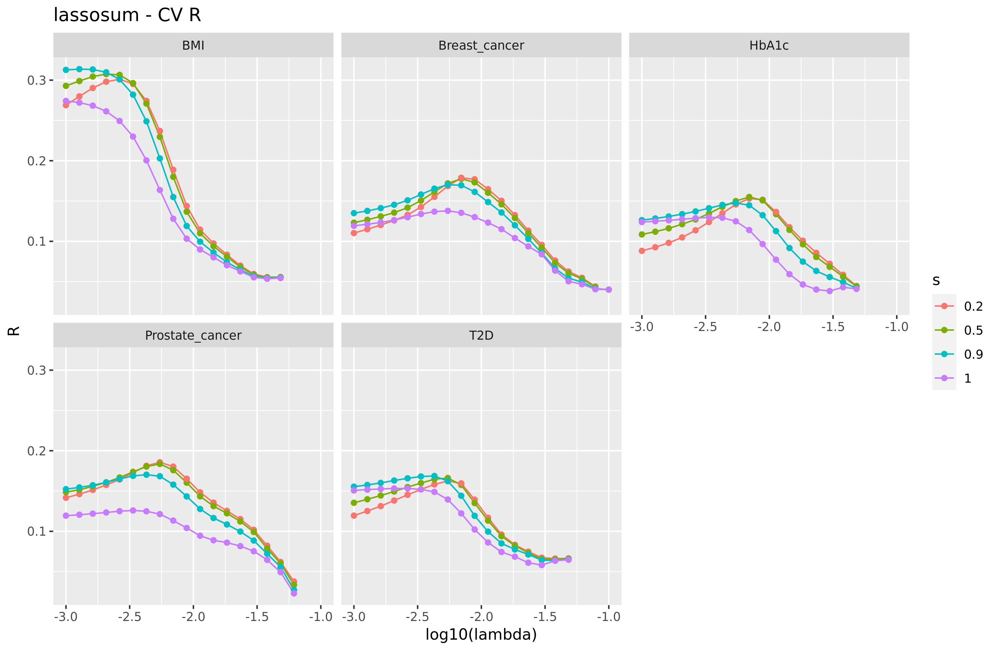

In [154]:
ggplot(filter(plotdata, variable=='CrossVal_R'), aes(y=value, x=log10(lambda)))+geom_line(aes(group=s, col=s))+geom_point(aes(col=s)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'lassosum - CV R') + xlab('log10(lambda)') + ylab('R')

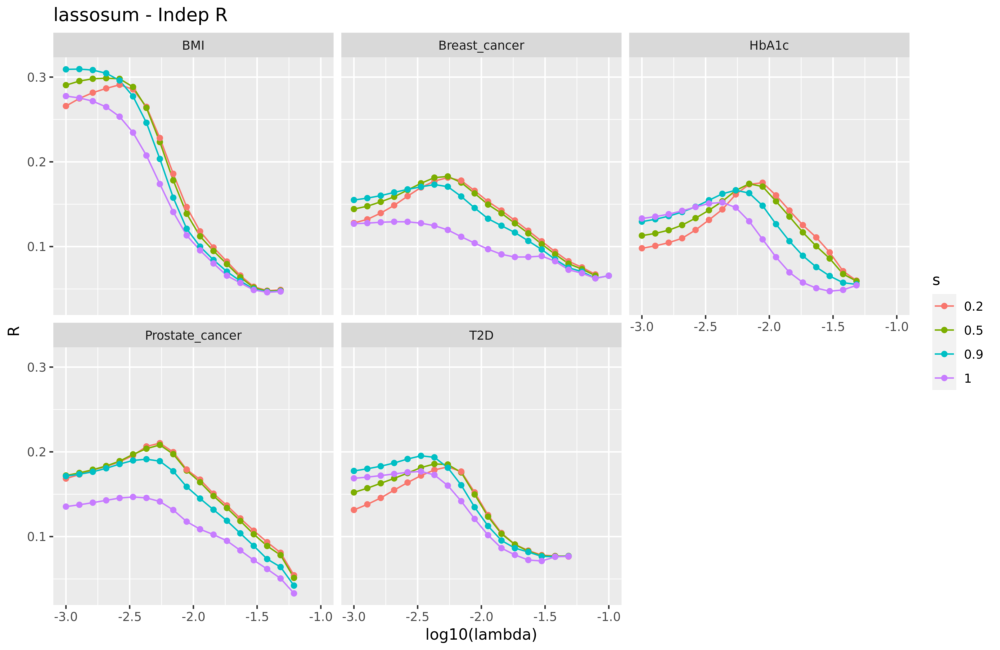

In [155]:
ggplot(filter(plotdata, variable=='IndepVal_R'), aes(y=value, x=log10(lambda)))+geom_line(aes(group=s, col=s))+geom_point(aes(col=s)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'lassosum - Indep R') + xlab('log10(lambda)') + ylab('R')

In [156]:
# PRScs 
# infer from file names

prscs_i <- grep('prscs\\.PredFile.*phi[0-9]+', res_pred_eval$Model)

prscs_phi <- res_pred_eval$Model[prscs_i]



In [157]:
prscs_phi <- gsub('.*phi','',prscs_phi)
prscs_phi <- gsub('_group','',prscs_phi)
prscs_phi <- gsub('e\\.', 'e-',prscs_phi)
prscs_phi <- as.numeric(prscs_phi)

In [158]:
plotdata <- res_pred_eval[prscs_i]
plotdata$phi <- prscs_phi
plotdata <- melt(plotdata,  measure.vars = c('CrossVal_R', 'IndepVal_R'), id.vars = c('pheno','study','phi'))

In [159]:
options(repr.plot.width=10, repr.plot.height=3, repr.plot.res=300)

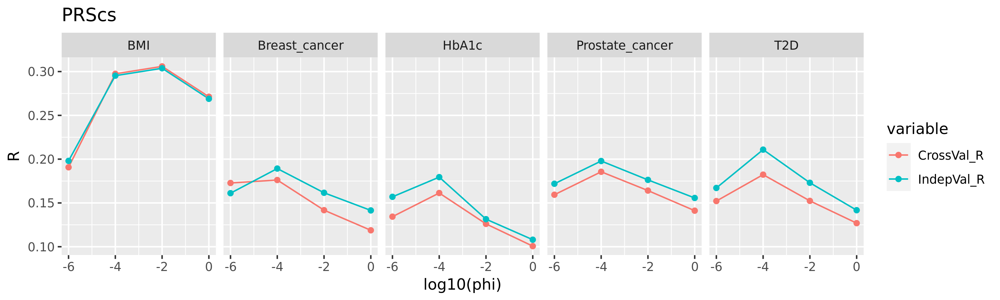

In [160]:
ggplot(plotdata, aes(x=log10(phi), y=value, col=variable))  + geom_line(aes(group=variable)) + geom_point() + facet_wrap(~pheno, nrow = 1) + labs(title = 'PRScs') + xlab('log10(phi)') + ylab('R')

In [161]:
# LDpred 
# infer from file names

ldpred_i <- grep('ldpred\\.PredFile.*p[0-9]+', res_pred_eval$Model)

ldpred_p <- res_pred_eval$Model[ldpred_i]



In [162]:
ldpred_p <- gsub('.*LDpred\\.p','',ldpred_p)
ldpred_p <- gsub('_group','',ldpred_p)
ldpred_p <- gsub('e\\.', 'e-',ldpred_p)
ldpred_p <- as.numeric(ldpred_p)

In [163]:
plotdata <- res_pred_eval[ldpred_i]
plotdata$p <- ldpred_p
plotdata <- melt(plotdata,  measure.vars = c('CrossVal_R', 'IndepVal_R'), id.vars = c('pheno','study','p'))

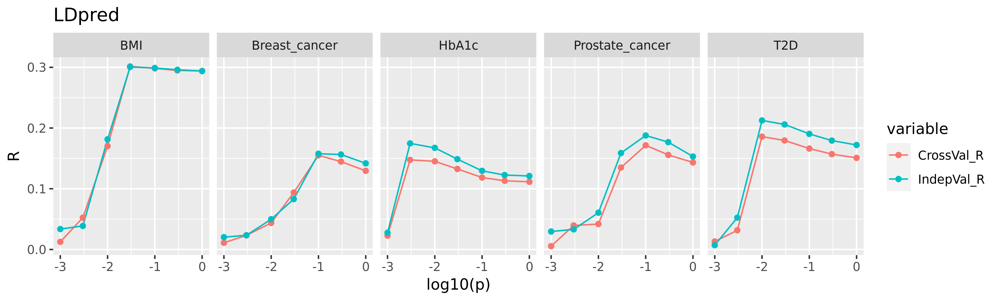

In [164]:
ggplot(plotdata, aes(x=log10(p), y=value, col=variable))  + geom_line(aes(group=variable)) + geom_point() + facet_wrap(~pheno, nrow = 1) + labs(title = 'LDpred') + xlab('log10(p)') + ylab('R')

In [177]:
# LDpred 
# infer from file names

ldpred2_i <- which(grepl('ldpred2\\.PredFile.*', res_pred_eval$Model) & !(grepl('ldpred2\\.PredFile.*beta', res_pred_eval$Model)))

ldpred2_p <- res_pred_eval$Model[ldpred2_i]


In [178]:
for (s in unique(md$study_id)){
    ldpred2_p <- gsub(s,'',ldpred2_p)
}

In [179]:
ldpred2_p <- gsub('.*PredFile[0-9]+\\.\\.','',ldpred2_p)

In [180]:
ldpred2_p <- gsub('_group','',ldpred2_p)

In [181]:
ldpred2_all <- ldpred2_p # keep full string stored

In [182]:
ldpred2_all <- gsub('e\\.','e-',ldpred2_all)

In [183]:
ldpred2_p <- str_extract(ldpred2_all, pattern = '^[0-9]+\\.*[0-9]*(e\\-)?[0-9]*')

In [184]:
ldpred2_h2 <- gsub(pattern = '(^[0-9](\\.[0-9]*)?e-[0-9]+\\.)|(^[0-9]+\\.[0-9]+\\.)','',ldpred2_all)

In [185]:
ldpred2_h2 <- gsub(pattern = '\\.sparse|\\.nosparse', '', ldpred2_h2)

In [186]:
ldpred2_h2 <- paste0(ifelse(grepl('\\.',ldpred2_h2), yes = '',no='0.'), ldpred2_h2)

In [187]:
ldpred2_sparse <- str_extract('sparse|nosparse', string = ldpred2_all)

In [188]:
unique(ldpred2_p)

[1] "1e-05"   "1.8e-05" "3.2e-05" "5.6e-05" "1e-04"   "0.00018" "0.00032"
 [8] "0.00056" "0.001"   "0.0018"  "0.0032"  "0.0056"  "0.01"    "0.018"  
[15] "0.032"   "0.056"   "0.1"     "0.18"    "0.32"    "0.56"    "1.0"

In [189]:
unique(ldpred2_h2)

[1] "0.0753" "0.1075" "0.1505" "0.0519" "0.0741" "0.1038" "0.1146" "0.1637"
 [9] "0.2292" "0.125"  "0.1786" "0.25"   "0.0553" "0.079"  "0.1107"

In [190]:
unique(ldpred2_sparse)

[1] "nosparse" "sparse"

In [191]:
plotdata <- res_pred_eval[ldpred2_i]
plotdata$h2 <- as.numeric(ldpred2_h2)
plotdata$p <- as.numeric(ldpred2_p)
plotdata$sparse <- ldpred2_sparse

plotdata <- melt(plotdata,  measure.vars = c('CrossVal_R', 'IndepVal_R'), id.vars = c('pheno','study','p','h2','sparse'))

In [192]:
options(repr.plot.width=10, repr.plot.height=6.5, repr.plot.res=300)

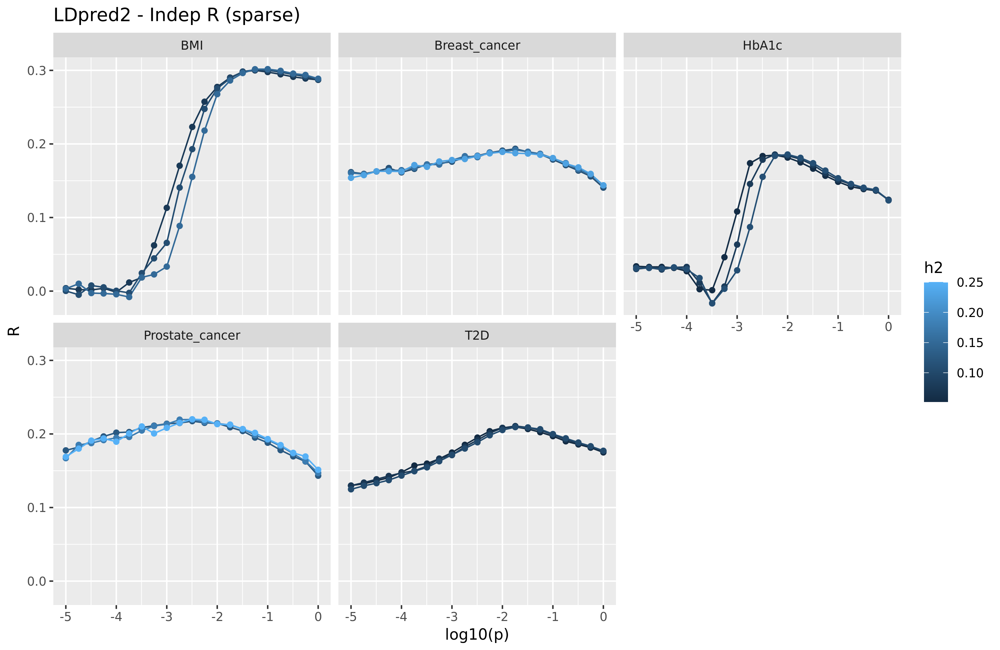

In [193]:
ggplot(filter(plotdata, variable=='IndepVal_R', sparse == 'sparse'), aes(y=value, x=log10(p)))+geom_line(aes(group=h2, col=h2))+geom_point(aes(col=h2)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'LDpred2 - Indep R (sparse)') + xlab('log10(p)') + ylab('R')

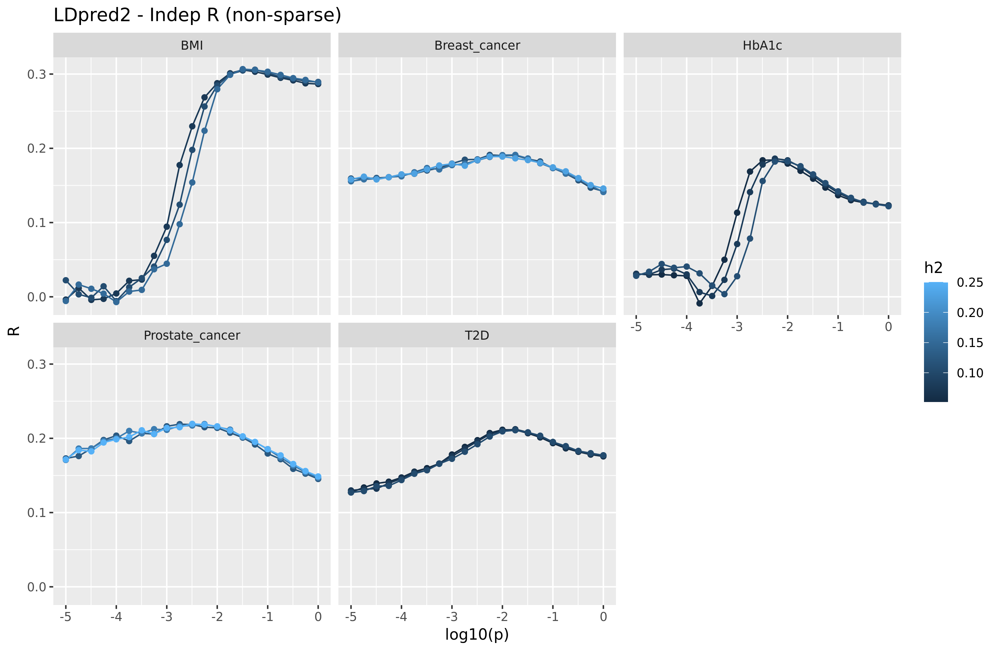

In [194]:
ggplot(filter(plotdata, variable=='IndepVal_R', sparse == 'nosparse'), aes(y=value, x=log10(p)))+geom_line(aes(group=h2, col=h2))+geom_point(aes(col=h2)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'LDpred2 - Indep R (non-sparse)') + xlab('log10(p)') + ylab('R')

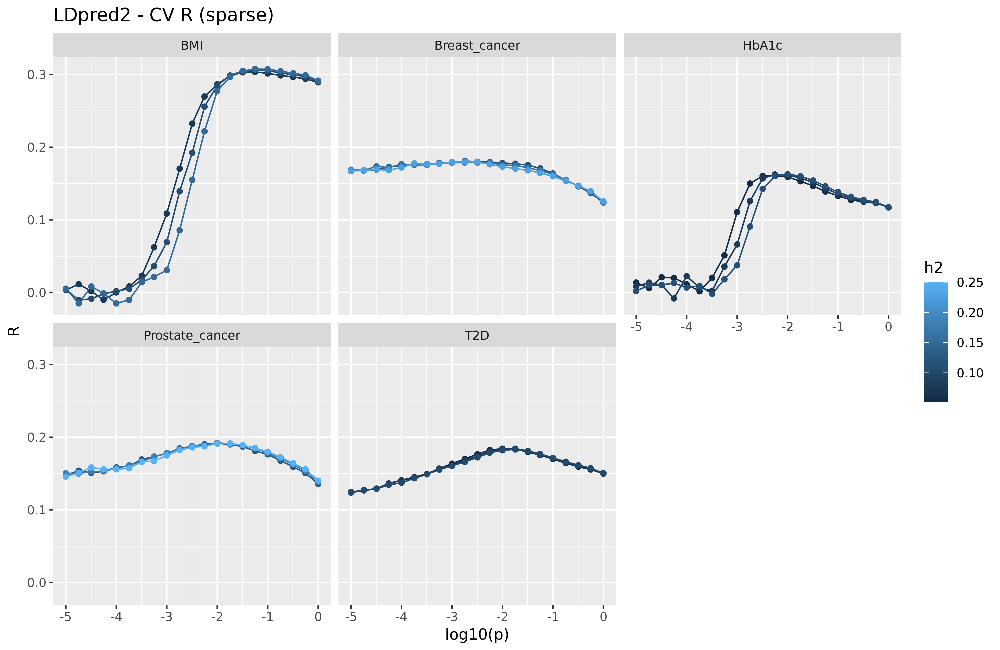

In [195]:
ggplot(filter(plotdata, variable=='CrossVal_R', sparse == 'sparse'), aes(y=value, x=log10(p)))+geom_line(aes(group=h2, col=h2))+geom_point(aes(col=h2)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'LDpred2 - CV R (sparse)') + xlab('log10(p)') + ylab('R')

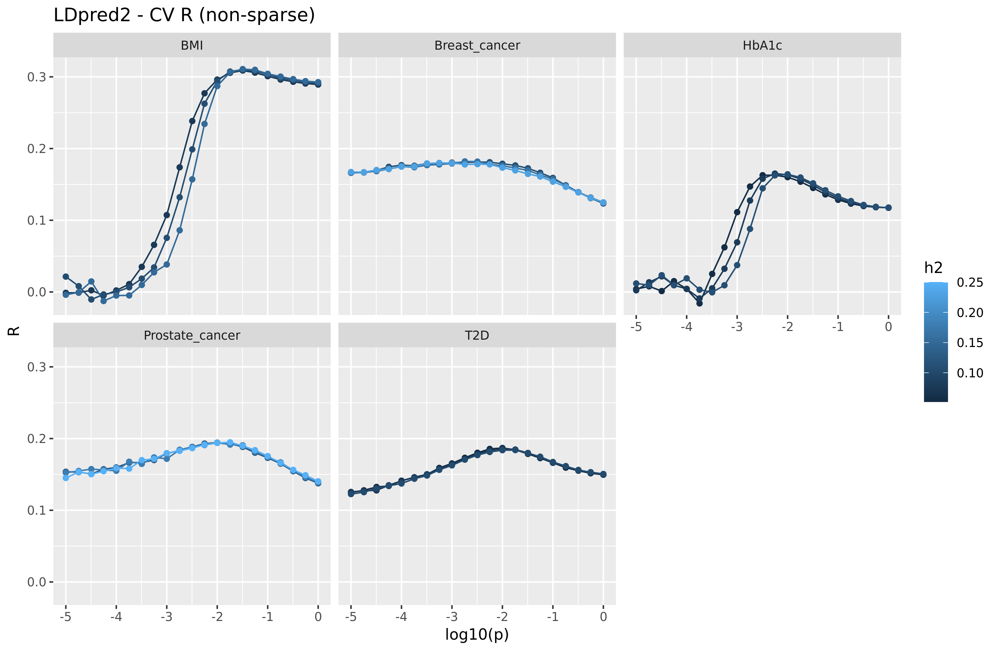

In [196]:
# h2 estimate seeems to have very small effect (especially close to the best performance)
ggplot(filter(plotdata, variable=='CrossVal_R', sparse == 'nosparse'), aes(y=value, x=log10(p)))+geom_line(aes(group=h2, col=h2))+geom_point(aes(col=h2)) + facet_wrap(~pheno, nrow = 2) + labs(title = 'LDpred2 - CV R (non-sparse)') + xlab('log10(p)') + ylab('R')

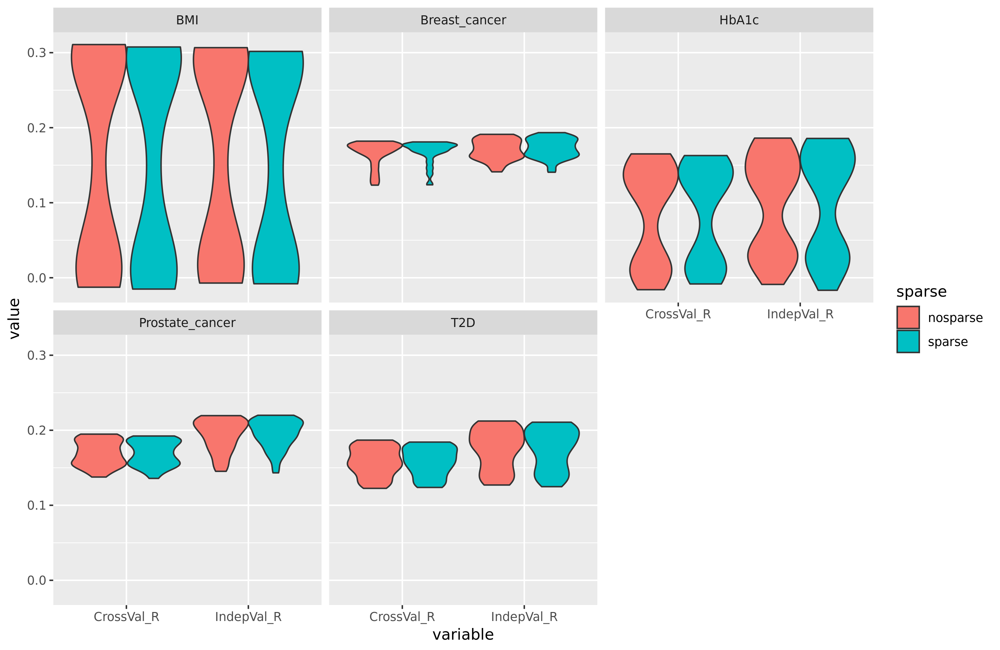

In [197]:
ggplot(plotdata, aes(x=variable, y=value, fill=sparse, coll=sparse)) + geom_violin(scale='width') + facet_wrap(~pheno, nrow = 2) 

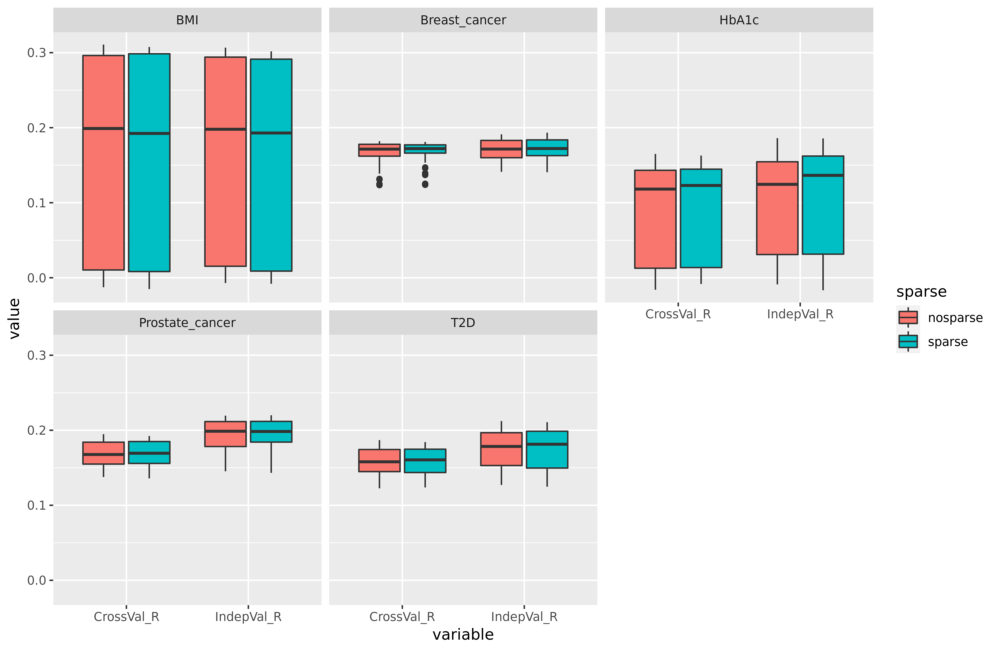

In [198]:
ggplot(plotdata, aes(x=variable, y=value, fill=sparse, coll=sparse)) + geom_boxplot() + facet_wrap(~pheno, nrow = 2) # sparse vs non-sparse seems to make very little difference